# Conditional GAN

#### Packages and Visualization

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [4]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    return nn.functional.one_hot(labels, num_classes= n_classes)

In [15]:
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
      y: (n_samples, ?) the second vector.
    '''
    combined = torch.cat((x.float(), y.float()), 1)
    return combined

## Training

In [18]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [19]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

In [22]:
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    return generator_input_dim, discriminator_im_chan

In [24]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Epoch 1, step 500: Generator loss: 2.377112544298172, discriminator loss: 0.2538329838179052


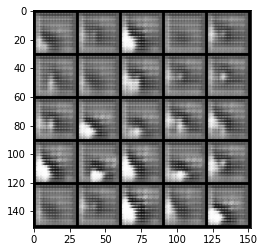

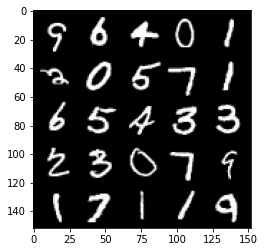

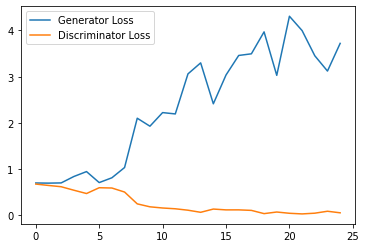

Epoch 2, step 1000: Generator loss: 3.8233235349655152, discriminator loss: 0.07686841424554586


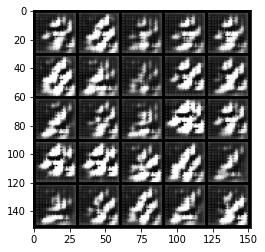

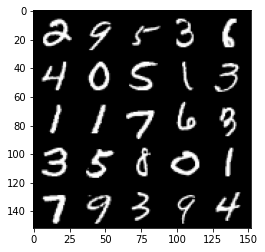

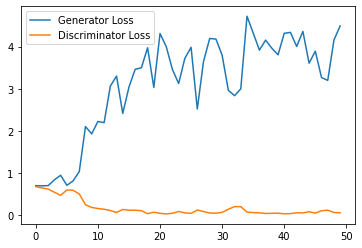

Epoch 3, step 1500: Generator loss: 3.9699532084465026, discriminator loss: 0.07837053655833005


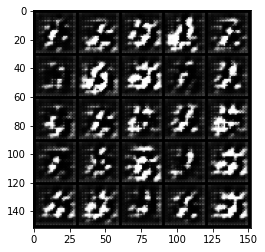

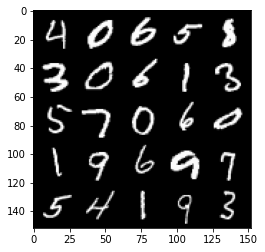

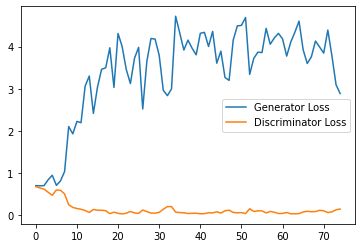

Epoch 4, step 2000: Generator loss: 3.311564908504486, discriminator loss: 0.1299979078397155


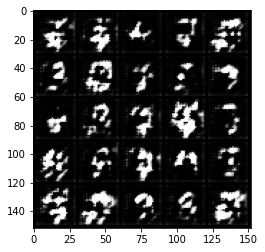

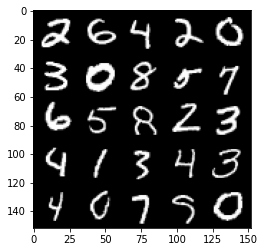

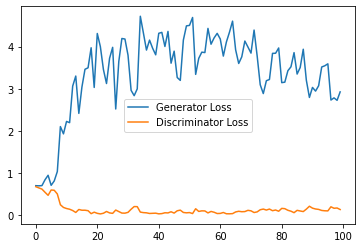

Epoch 5, step 2500: Generator loss: 3.0129045383930206, discriminator loss: 0.20505867866426705


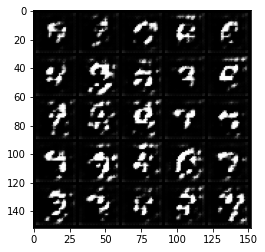

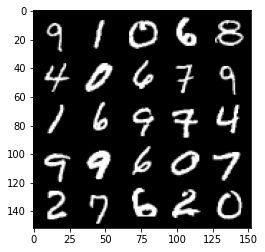

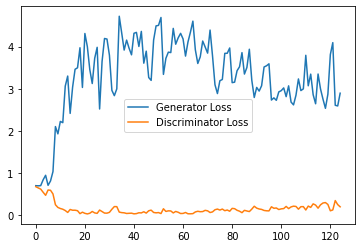

Epoch 6, step 3000: Generator loss: 2.6623262445926668, discriminator loss: 0.2554433638304472


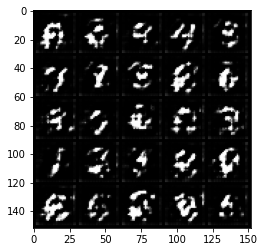

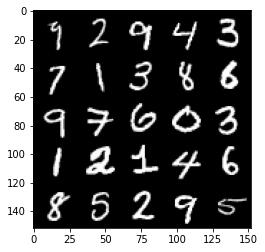

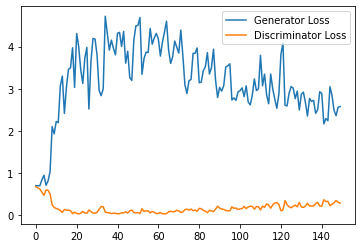

Epoch 7, step 3500: Generator loss: 2.533890974521637, discriminator loss: 0.2669953075796366


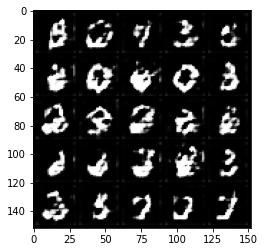

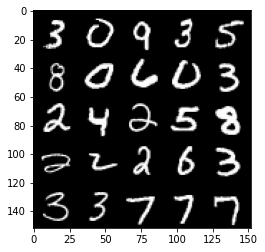

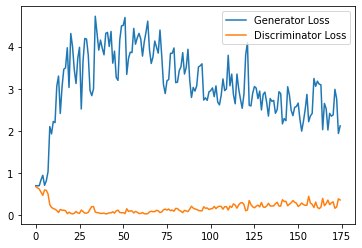

Epoch 8, step 4000: Generator loss: 2.400574728727341, discriminator loss: 0.27537239211797715


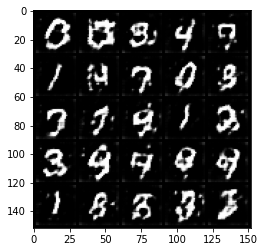

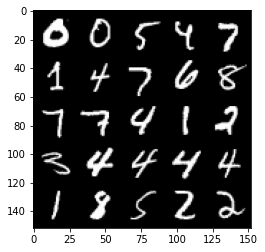

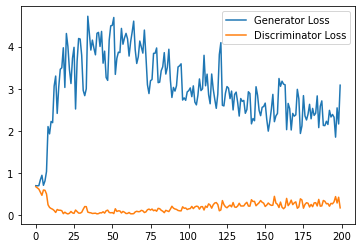

Epoch 9, step 4500: Generator loss: 2.044536457300186, discriminator loss: 0.3172753072977066


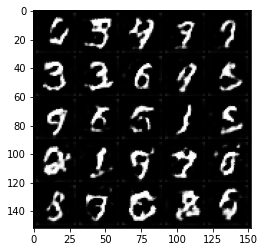

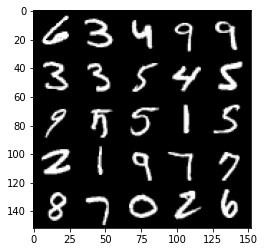

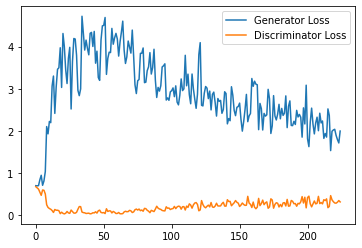

Epoch 10, step 5000: Generator loss: 2.04605864071846, discriminator loss: 0.3222069591879845


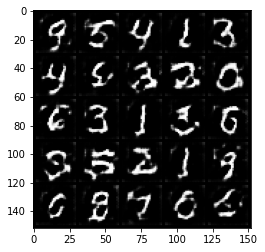

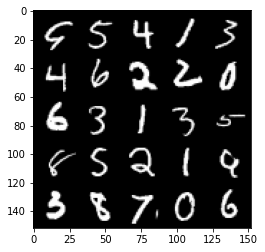

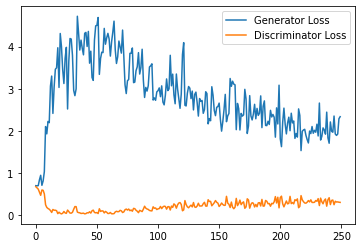

Epoch 11, step 5500: Generator loss: 1.9181571633815766, discriminator loss: 0.3556038701236248


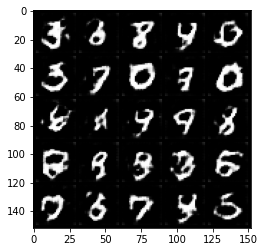

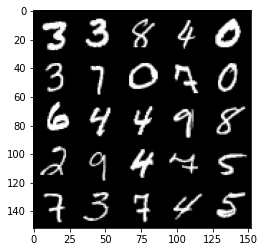

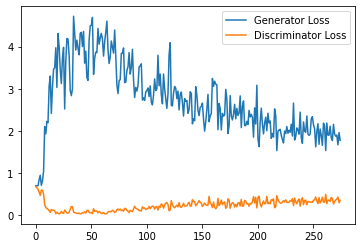

Epoch 12, step 6000: Generator loss: 1.8019891262054444, discriminator loss: 0.3798643556535244


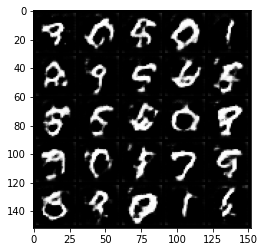

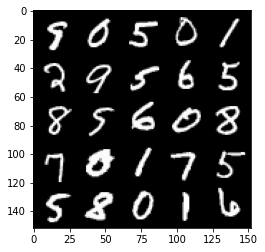

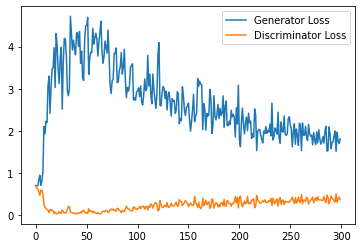

Epoch 13, step 6500: Generator loss: 1.6722353961467742, discriminator loss: 0.41316987362504004


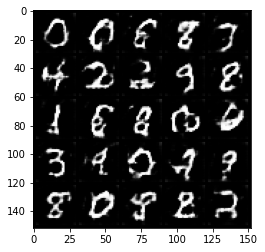

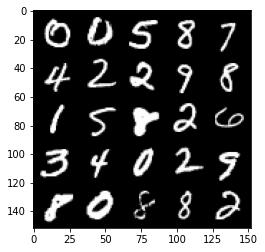

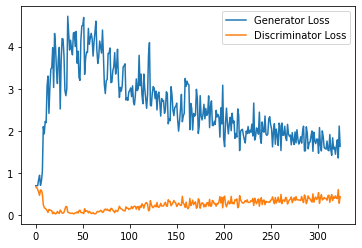

Epoch 14, step 7000: Generator loss: 1.6050689160823821, discriminator loss: 0.44368895363807676


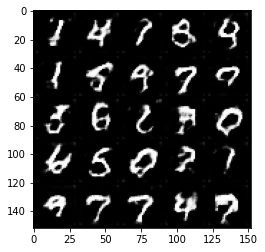

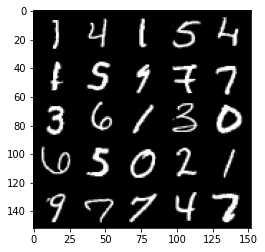

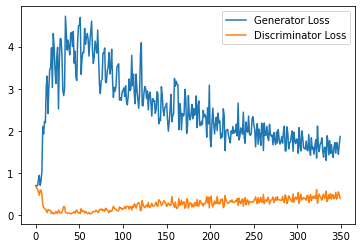

Epoch 15, step 7500: Generator loss: 1.5534122986793517, discriminator loss: 0.45482214003801347


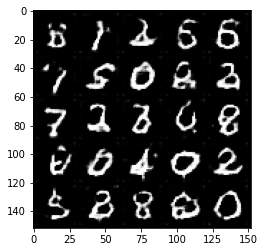

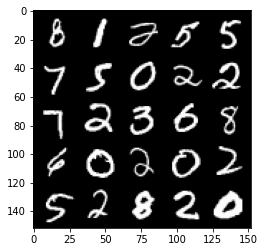

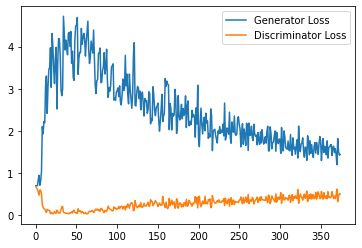

Epoch 17, step 8000: Generator loss: 1.4640755149126052, discriminator loss: 0.48156805175542833


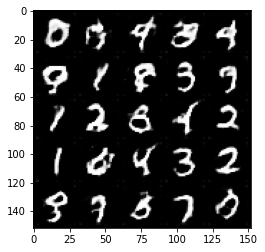

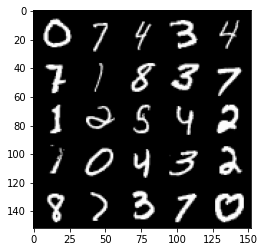

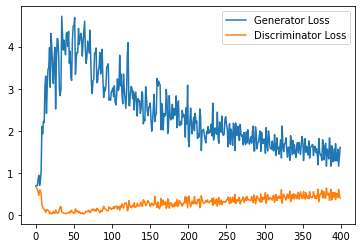

Epoch 18, step 8500: Generator loss: 1.3803976516723633, discriminator loss: 0.48852469539642335


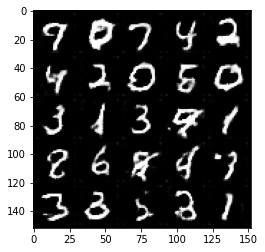

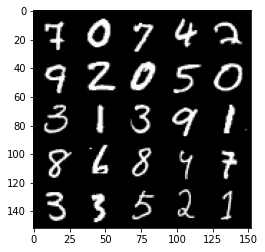

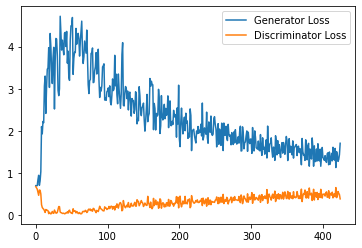

Epoch 19, step 9000: Generator loss: 1.3631203724145888, discriminator loss: 0.5142194502353669


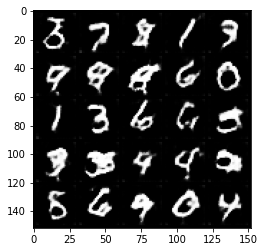

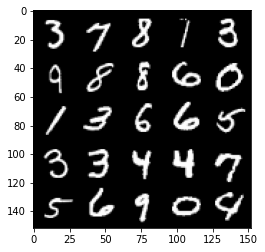

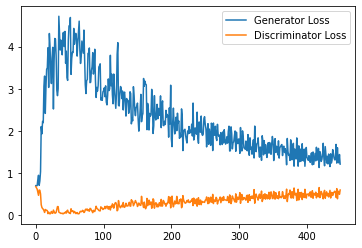

Epoch 20, step 9500: Generator loss: 1.3221431144475937, discriminator loss: 0.5045630653500557


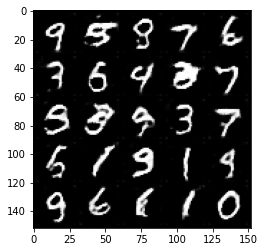

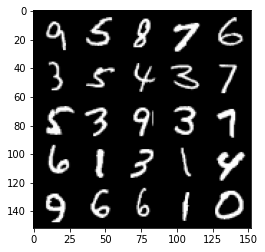

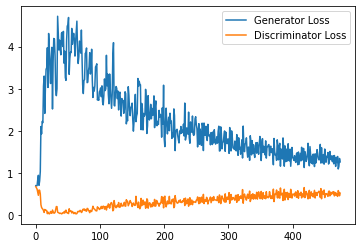

Epoch 21, step 10000: Generator loss: 1.321719869494438, discriminator loss: 0.5217564690113068


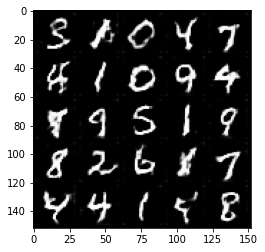

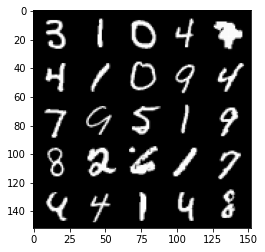

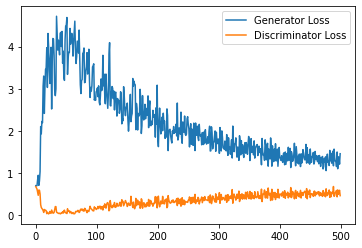

Epoch 22, step 10500: Generator loss: 1.2488423733711242, discriminator loss: 0.5256148493289947


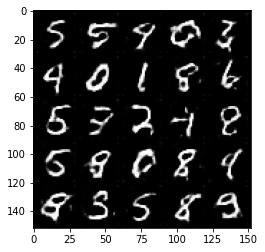

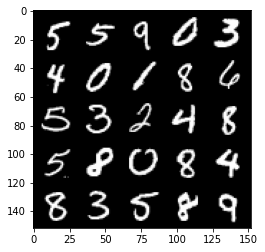

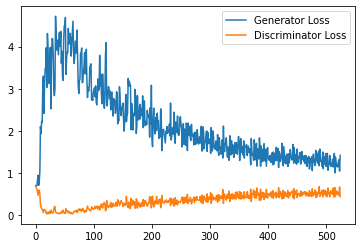

Epoch 23, step 11000: Generator loss: 1.2942934526205063, discriminator loss: 0.5296980403661727


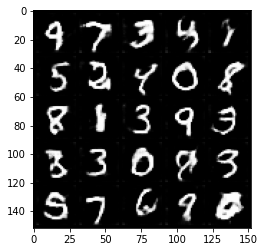

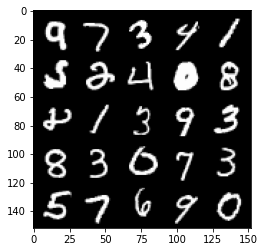

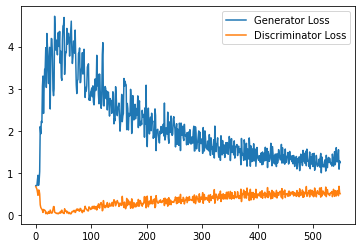

Epoch 24, step 11500: Generator loss: 1.2548816559314728, discriminator loss: 0.5317034252285957


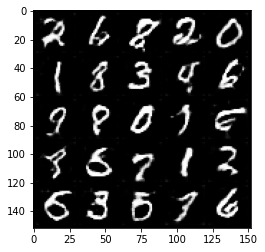

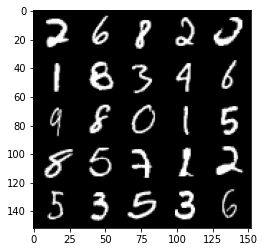

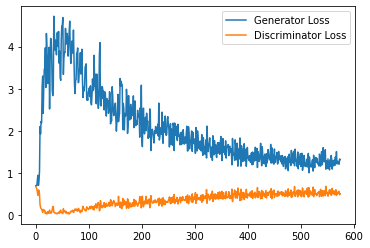

Epoch 25, step 12000: Generator loss: 1.1827971868515015, discriminator loss: 0.5470739105939865


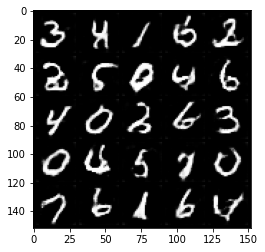

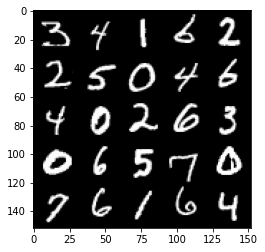

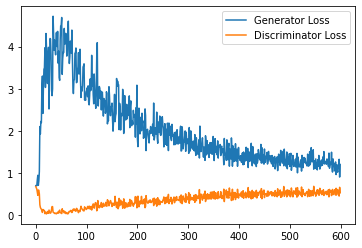

Epoch 26, step 12500: Generator loss: 1.245718421459198, discriminator loss: 0.5476673288941384


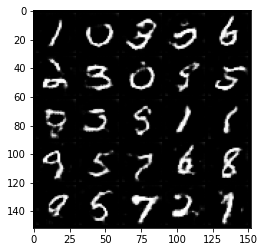

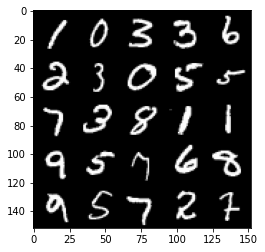

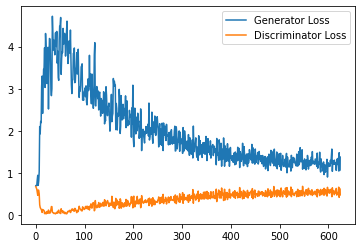

Epoch 27, step 13000: Generator loss: 1.1774045550823211, discriminator loss: 0.5582964895963669


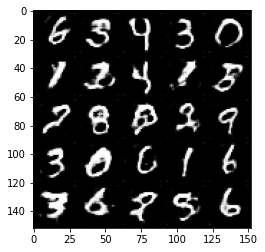

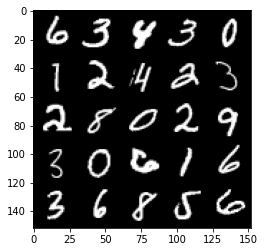

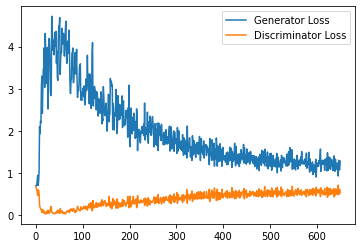

Epoch 28, step 13500: Generator loss: 1.157223904132843, discriminator loss: 0.5531141566634178


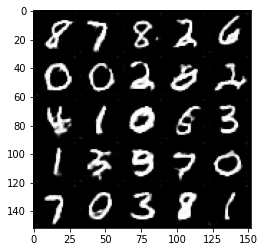

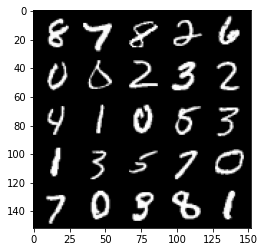

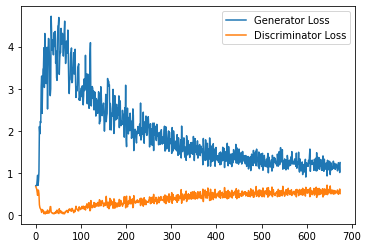

Epoch 29, step 14000: Generator loss: 1.2188919841051102, discriminator loss: 0.5544747902750969


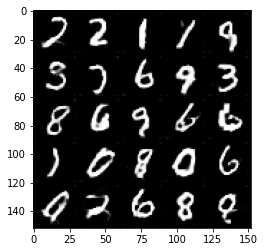

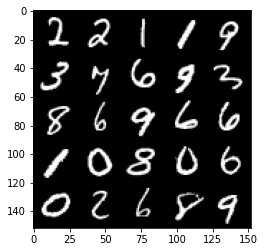

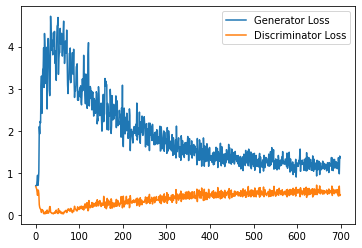

Epoch 30, step 14500: Generator loss: 1.131917270064354, discriminator loss: 0.5605287005305291


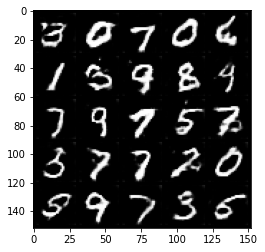

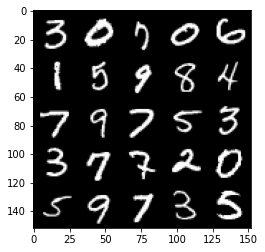

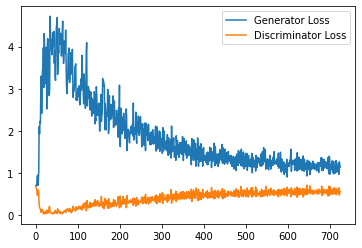

Epoch 31, step 15000: Generator loss: 1.1550461019277574, discriminator loss: 0.5595115293860435


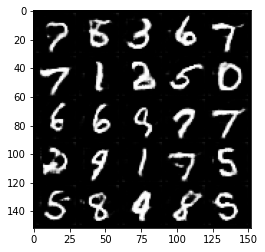

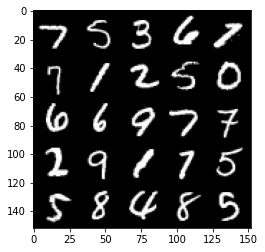

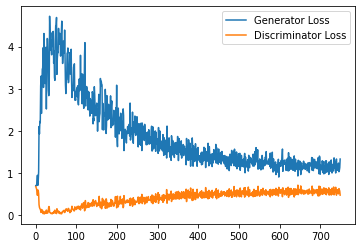

Epoch 33, step 15500: Generator loss: 1.1283215079307556, discriminator loss: 0.5615431863665581


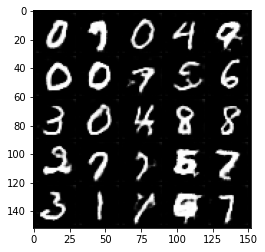

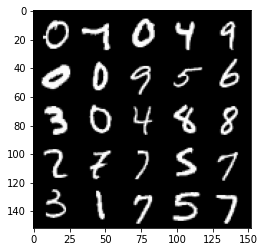

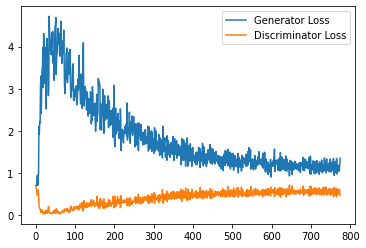

Epoch 34, step 16000: Generator loss: 1.108656122803688, discriminator loss: 0.5696386440396309


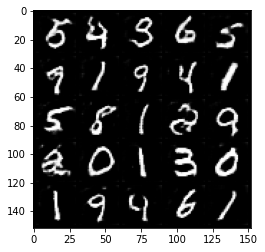

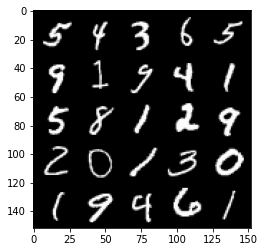

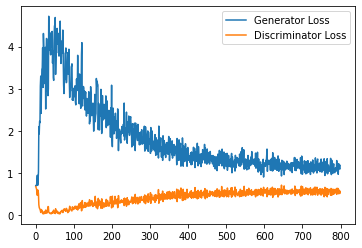

Epoch 35, step 16500: Generator loss: 1.1299395320415497, discriminator loss: 0.5681166371703148


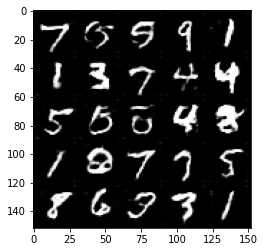

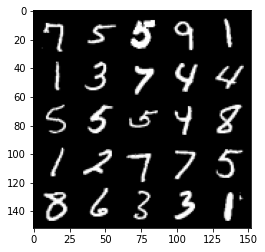

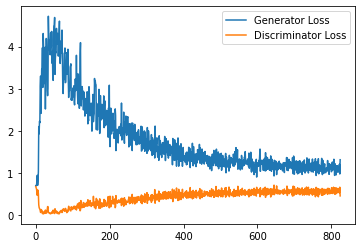

Epoch 36, step 17000: Generator loss: 1.1028593629598618, discriminator loss: 0.5769312019348145


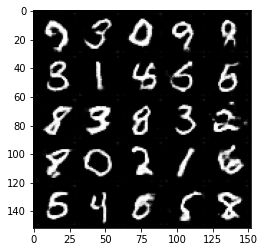

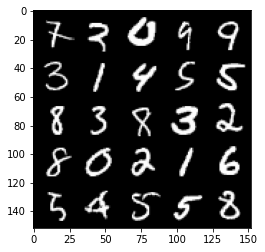

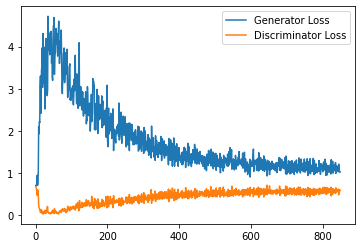

Epoch 37, step 17500: Generator loss: 1.106284119606018, discriminator loss: 0.5766697745323182


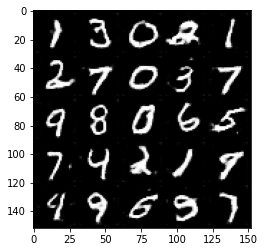

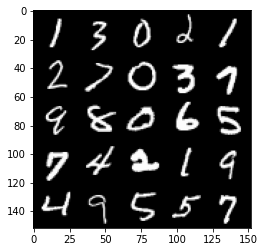

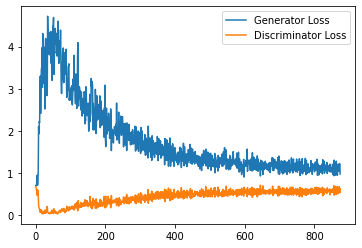

Epoch 38, step 18000: Generator loss: 1.097608541369438, discriminator loss: 0.5701924665570259


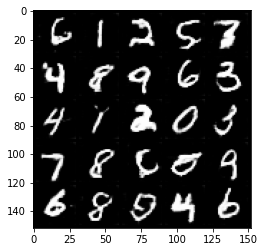

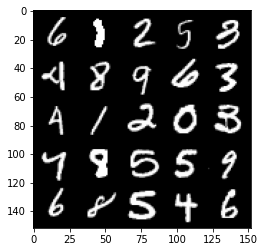

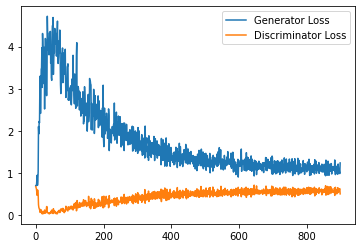

Epoch 39, step 18500: Generator loss: 1.0679988476037978, discriminator loss: 0.5828182960152626


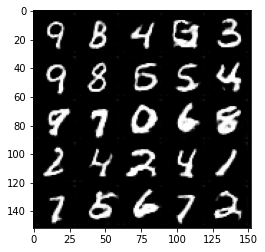

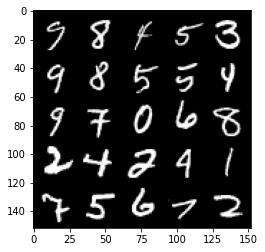

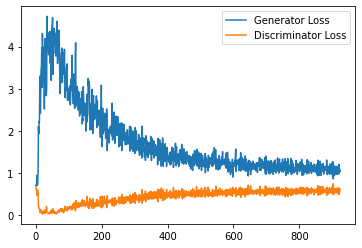

Epoch 40, step 19000: Generator loss: 1.0773297111988067, discriminator loss: 0.5789548739790916


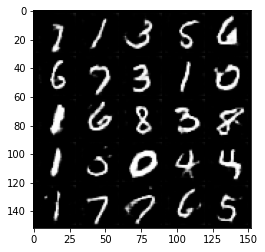

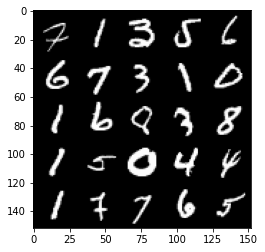

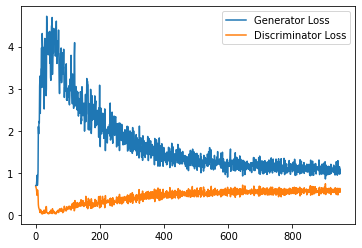

Epoch 41, step 19500: Generator loss: 1.073176603794098, discriminator loss: 0.5833665915131568


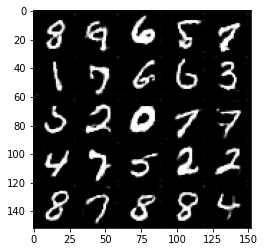

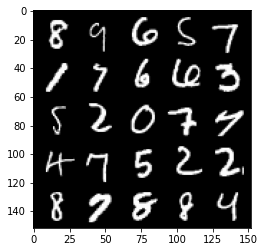

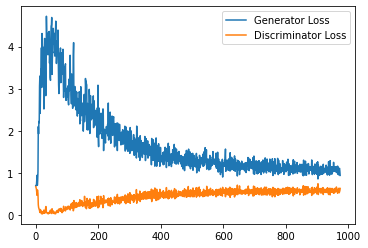

Epoch 42, step 20000: Generator loss: 1.0672147405147552, discriminator loss: 0.5820033226013184


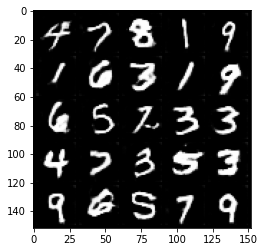

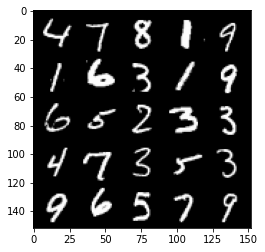

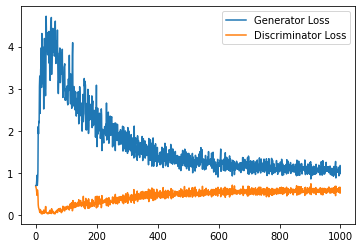

Epoch 43, step 20500: Generator loss: 1.0861651636362075, discriminator loss: 0.5833542127013206


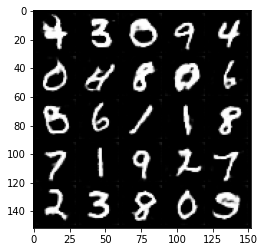

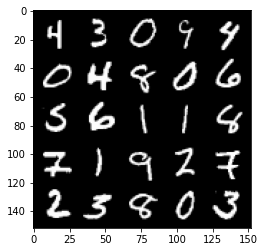

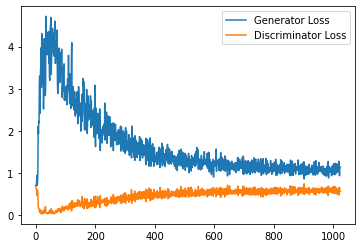

Epoch 44, step 21000: Generator loss: 1.0315322270393372, discriminator loss: 0.5897165701389313


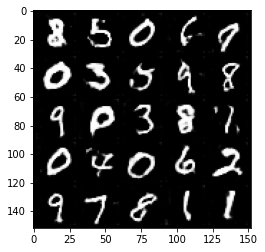

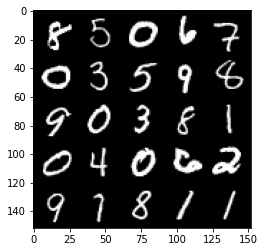

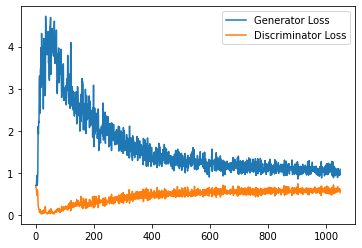

Epoch 45, step 21500: Generator loss: 1.0493311740159987, discriminator loss: 0.590991115808487


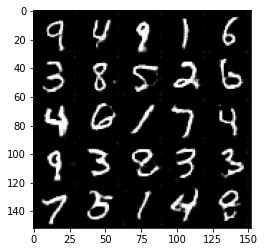

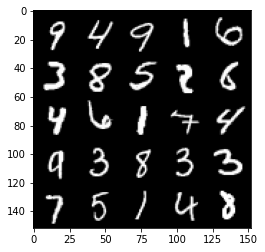

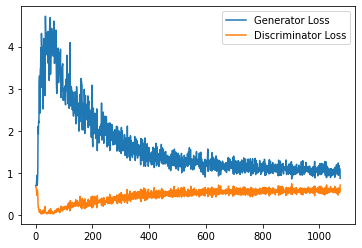

Epoch 46, step 22000: Generator loss: 1.0482259114980699, discriminator loss: 0.5923700712323189


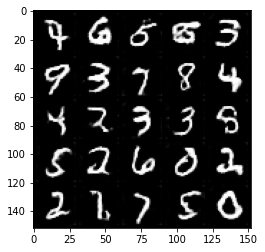

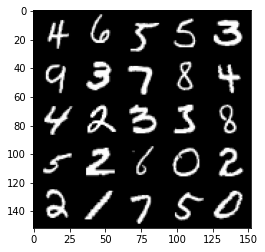

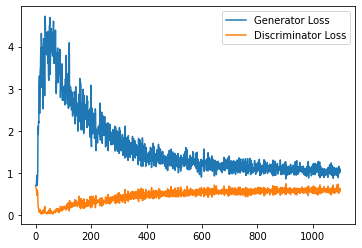

Epoch 47, step 22500: Generator loss: 1.0437636821269989, discriminator loss: 0.5958489408493042


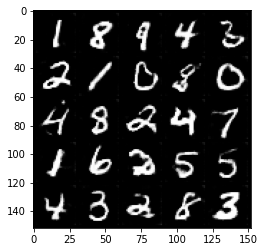

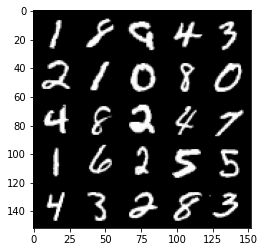

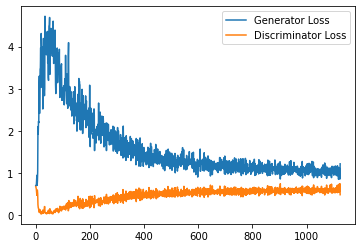

Epoch 49, step 23000: Generator loss: 1.0185748101472856, discriminator loss: 0.5916464866399765


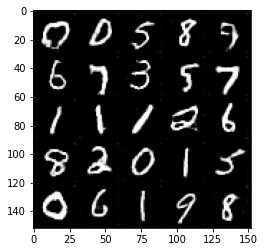

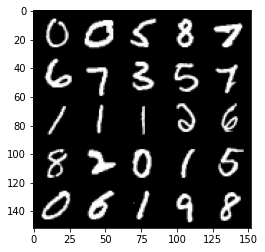

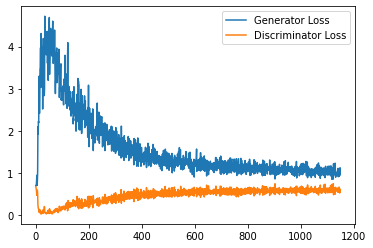

Epoch 50, step 23500: Generator loss: 1.0017672276496887, discriminator loss: 0.6003447998166084


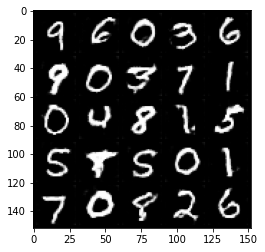

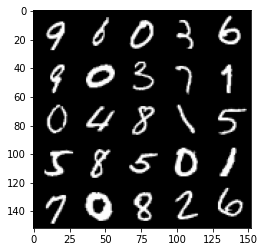

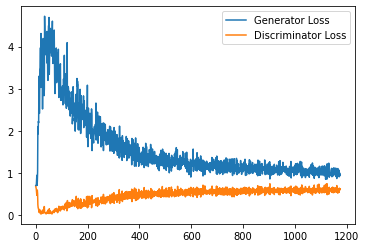

Epoch 51, step 24000: Generator loss: 1.0423881505727768, discriminator loss: 0.5940822142362595


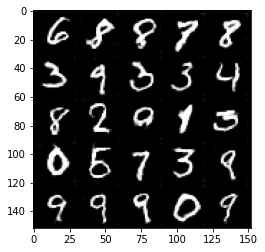

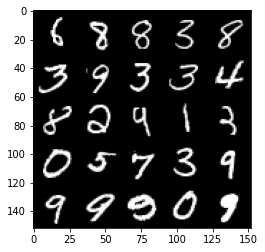

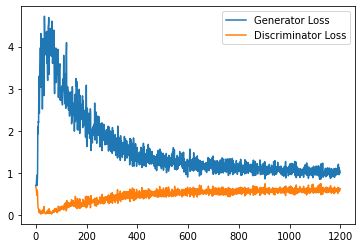

Epoch 52, step 24500: Generator loss: 1.014306924343109, discriminator loss: 0.6035037575960159


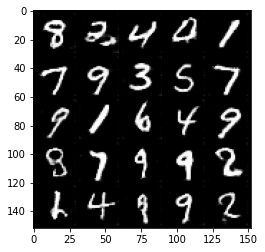

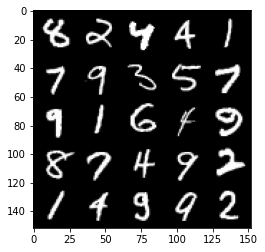

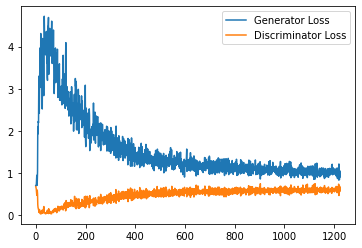

Epoch 53, step 25000: Generator loss: 0.9955899776220322, discriminator loss: 0.5980652669668197


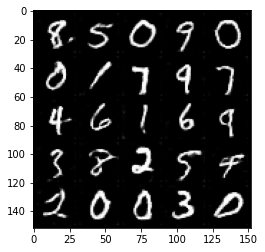

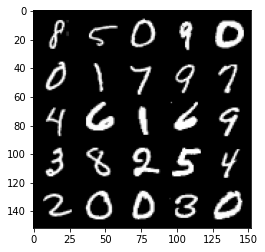

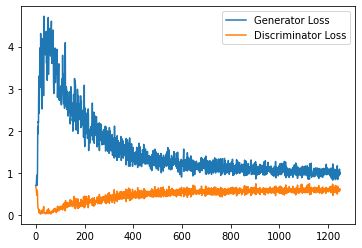

Epoch 54, step 25500: Generator loss: 0.9848227188587189, discriminator loss: 0.6081119247674942


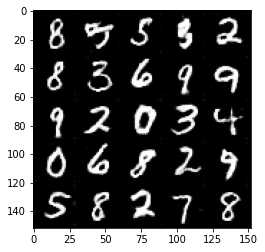

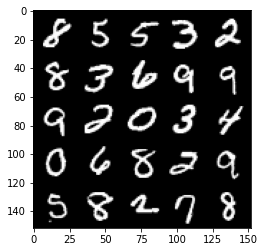

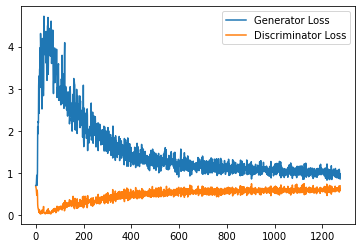

Epoch 55, step 26000: Generator loss: 1.006495901465416, discriminator loss: 0.5919755591750145


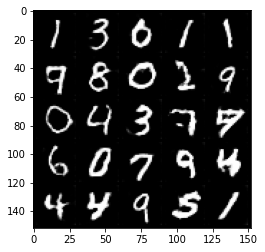

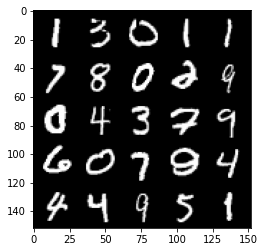

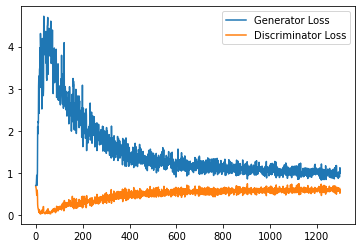

Epoch 56, step 26500: Generator loss: 0.9969202737808227, discriminator loss: 0.6028810153603554


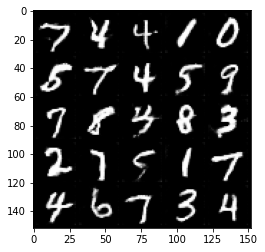

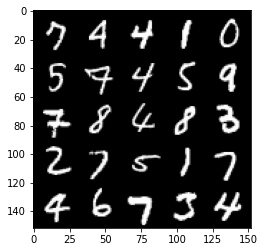

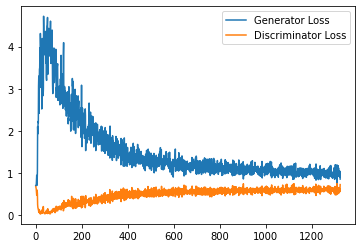

Epoch 57, step 27000: Generator loss: 1.019142479777336, discriminator loss: 0.6013525426983833


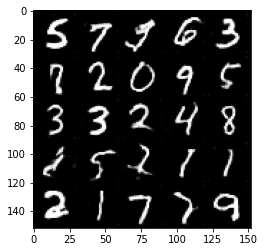

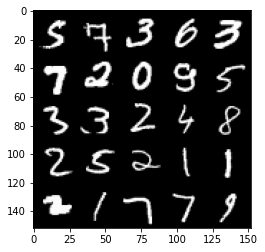

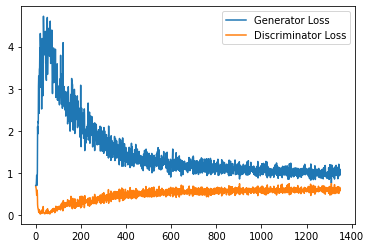

Epoch 58, step 27500: Generator loss: 0.9721278672218323, discriminator loss: 0.600705719947815


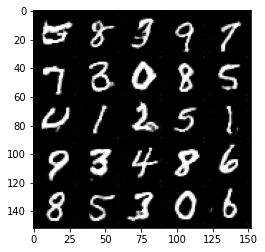

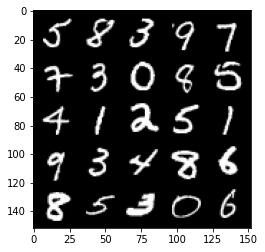

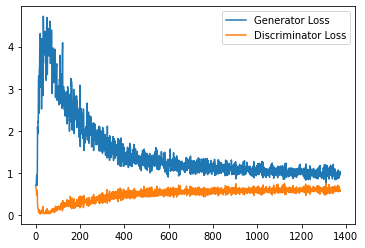

Epoch 59, step 28000: Generator loss: 1.0005616030693054, discriminator loss: 0.606611447930336


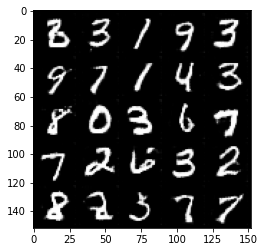

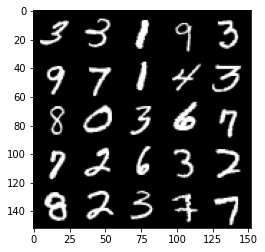

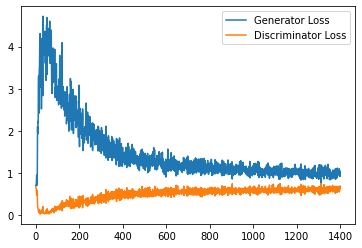

Epoch 60, step 28500: Generator loss: 1.0056704852581024, discriminator loss: 0.6043355174660683


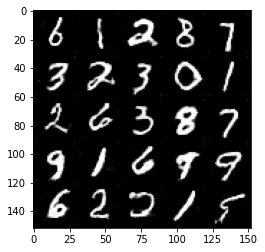

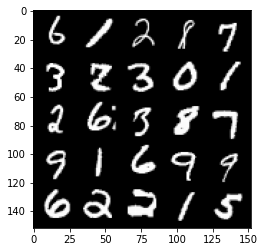

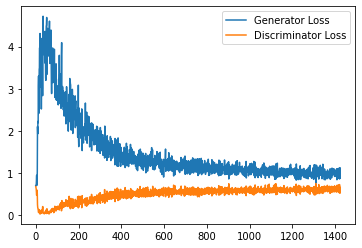

Epoch 61, step 29000: Generator loss: 0.9713725764751434, discriminator loss: 0.6049906968474388


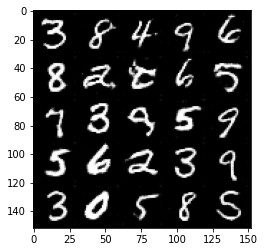

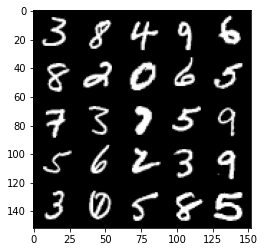

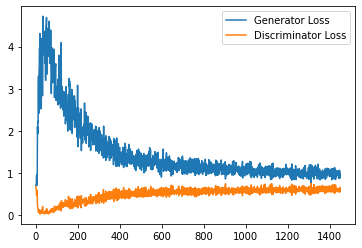

Epoch 62, step 29500: Generator loss: 0.9579376118183136, discriminator loss: 0.6082785771489143


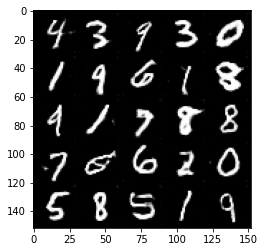

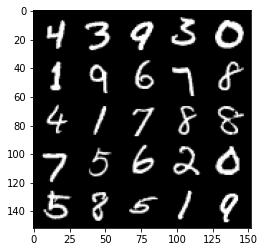

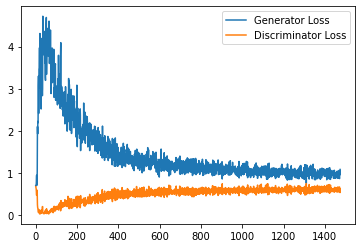

Epoch 63, step 30000: Generator loss: 0.9805410430431366, discriminator loss: 0.6084394018650054


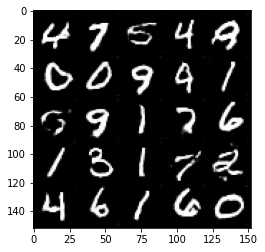

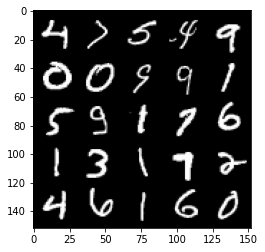

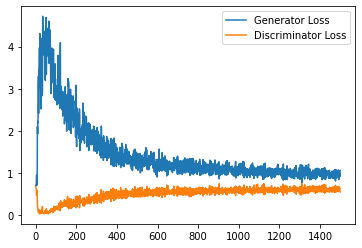

Epoch 65, step 30500: Generator loss: 0.9943464096784592, discriminator loss: 0.6110338711738587


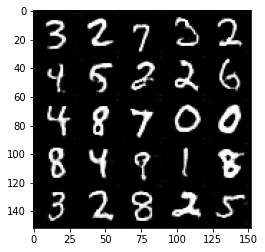

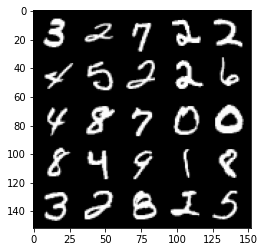

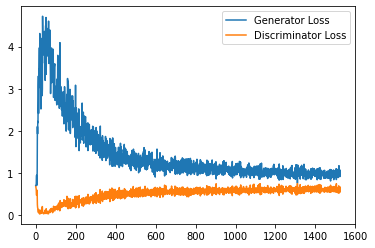

Epoch 66, step 31000: Generator loss: 0.9600820955038071, discriminator loss: 0.6069901974201203


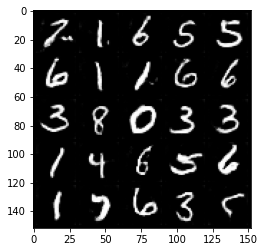

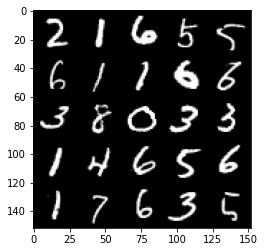

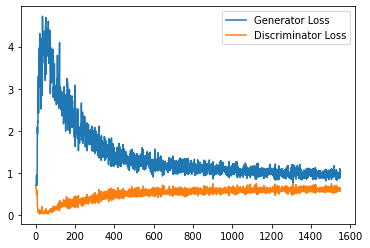

Epoch 67, step 31500: Generator loss: 0.9657615758180619, discriminator loss: 0.6127078582048416


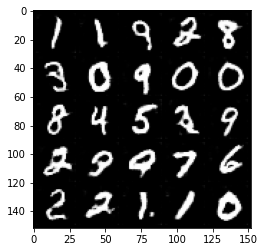

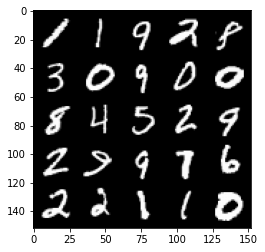

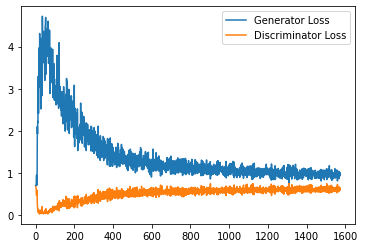

Epoch 68, step 32000: Generator loss: 0.9959594589471817, discriminator loss: 0.6032464343309403


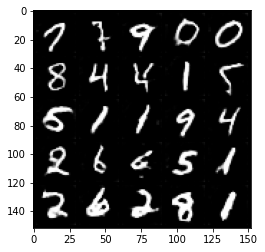

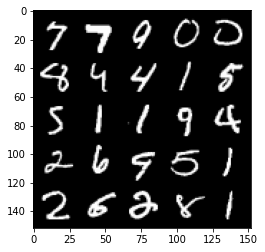

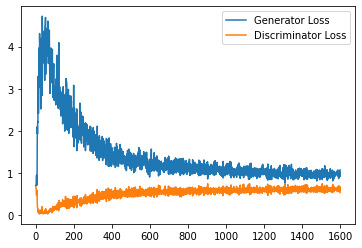

Epoch 69, step 32500: Generator loss: 0.9748307484388351, discriminator loss: 0.6073993813991546


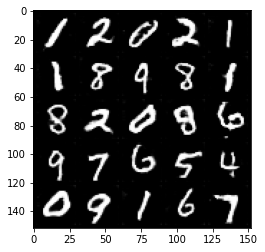

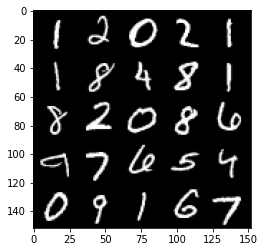

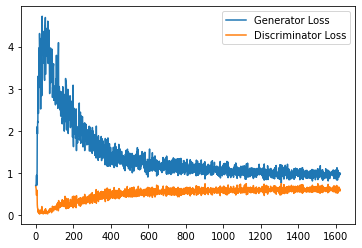

Epoch 70, step 33000: Generator loss: 0.9699962641000748, discriminator loss: 0.6134820775985718


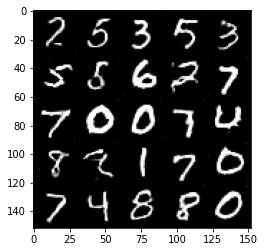

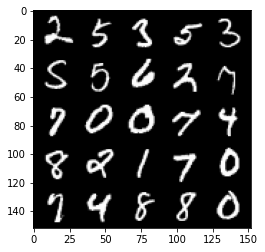

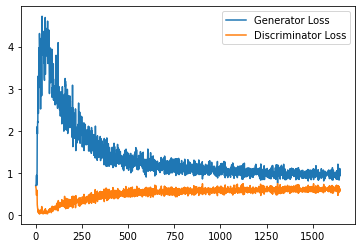

Epoch 71, step 33500: Generator loss: 0.9599275134801865, discriminator loss: 0.6115027915239334


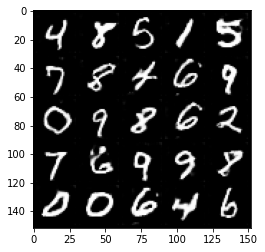

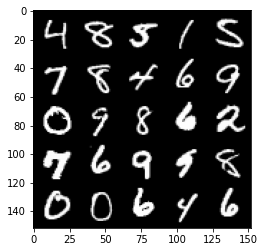

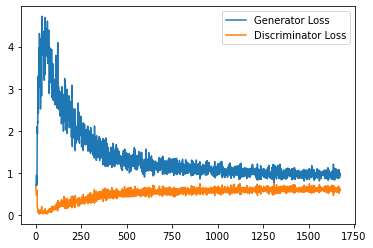

Epoch 72, step 34000: Generator loss: 0.9752735332250595, discriminator loss: 0.6101821790933609


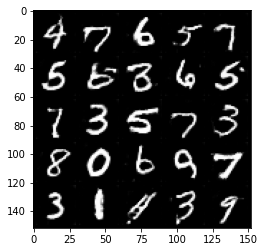

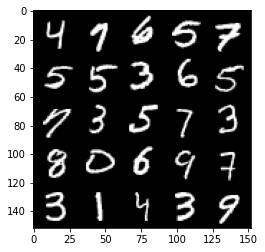

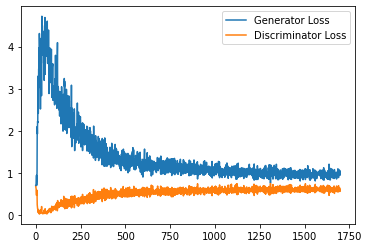

Epoch 73, step 34500: Generator loss: 0.9676307114362717, discriminator loss: 0.612886833190918


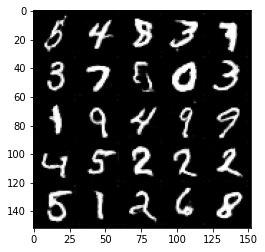

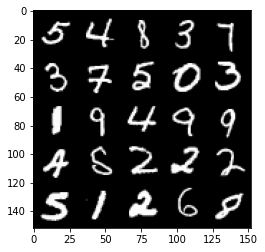

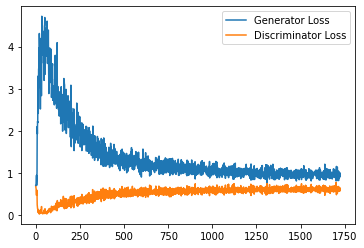

Epoch 74, step 35000: Generator loss: 0.949717522740364, discriminator loss: 0.6089009169340134


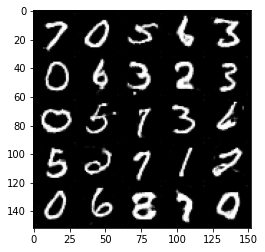

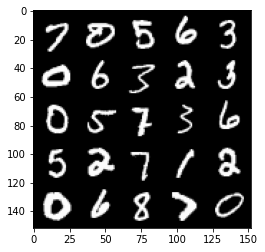

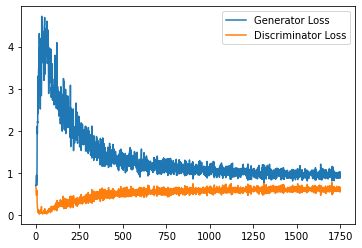

Epoch 75, step 35500: Generator loss: 0.9533140643835067, discriminator loss: 0.6089737766981125


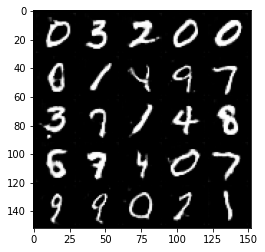

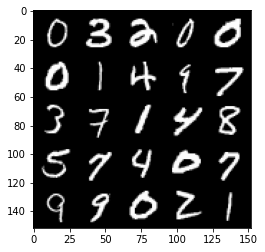

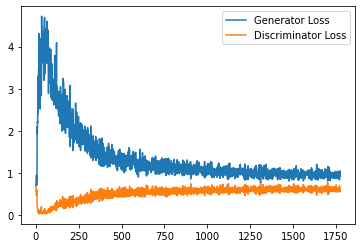

Epoch 76, step 36000: Generator loss: 0.9469198654890061, discriminator loss: 0.6175480898618698


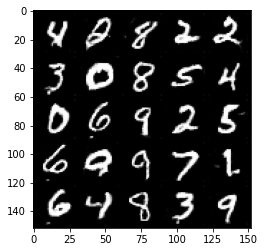

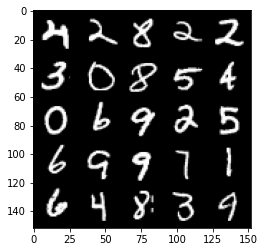

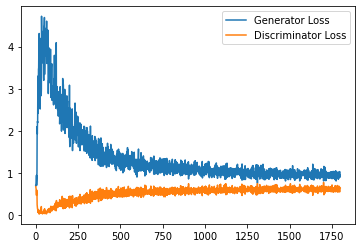

Epoch 77, step 36500: Generator loss: 0.9793898241519928, discriminator loss: 0.6125891425609589


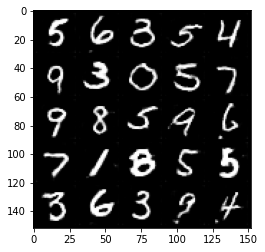

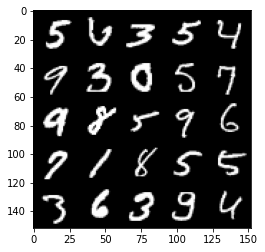

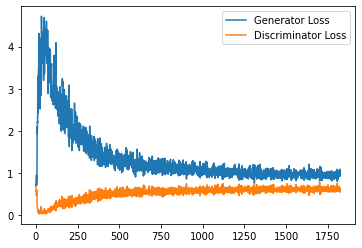

Epoch 78, step 37000: Generator loss: 0.9783226764202118, discriminator loss: 0.6064709978699684


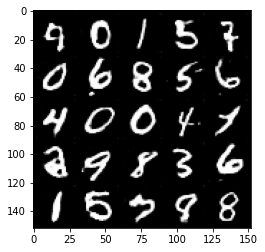

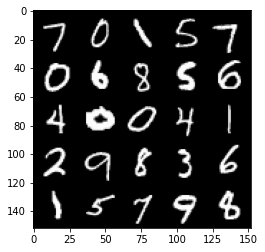

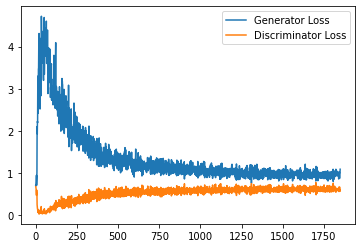

Epoch 79, step 37500: Generator loss: 0.979901291012764, discriminator loss: 0.6091395918726921


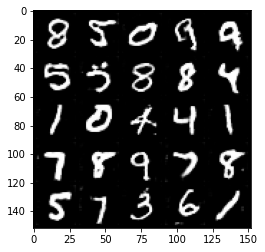

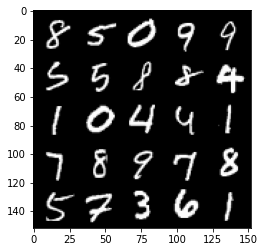

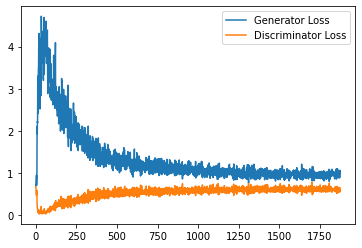

Epoch 81, step 38000: Generator loss: 0.965085689663887, discriminator loss: 0.6101732769012451


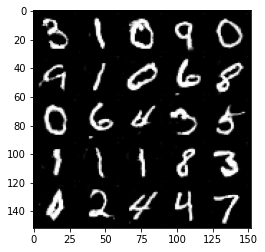

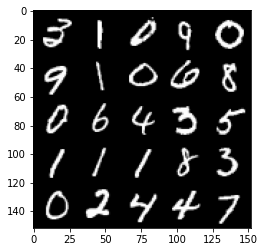

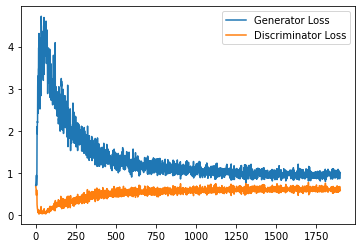

Epoch 82, step 38500: Generator loss: 0.9854064948558807, discriminator loss: 0.6134705198407173


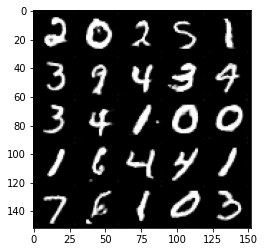

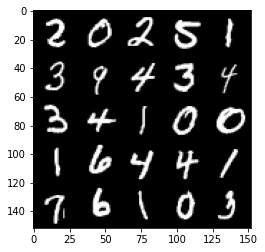

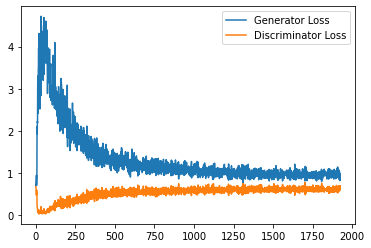

Epoch 83, step 39000: Generator loss: 0.9663144799470902, discriminator loss: 0.6059502266645431


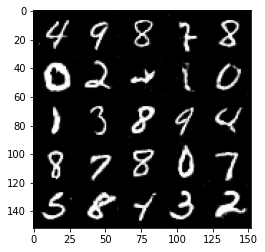

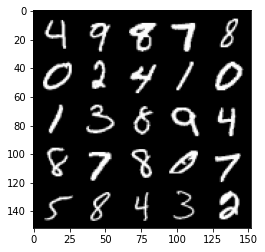

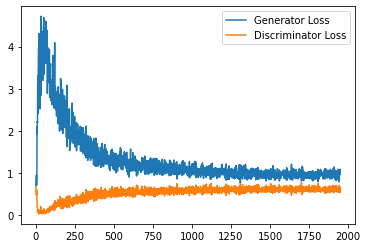

Epoch 84, step 39500: Generator loss: 0.9609268091917038, discriminator loss: 0.6062714837789536


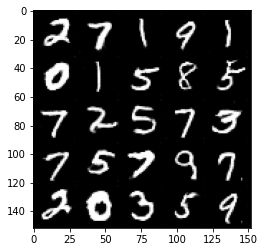

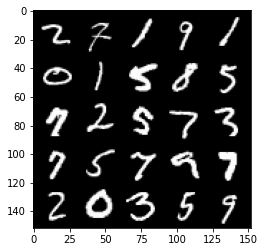

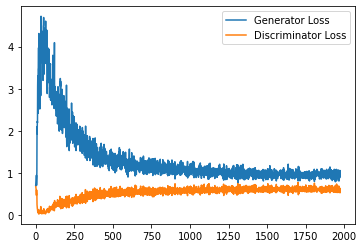

Epoch 85, step 40000: Generator loss: 0.9749151622056961, discriminator loss: 0.6071759487390518


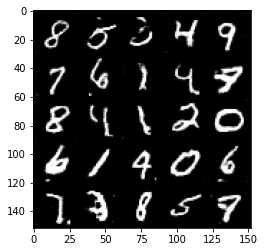

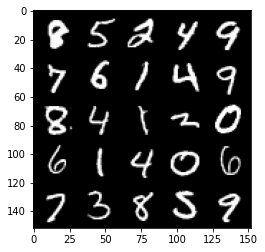

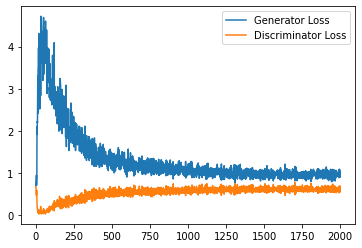

Epoch 86, step 40500: Generator loss: 0.9817424043416977, discriminator loss: 0.6142613223791122


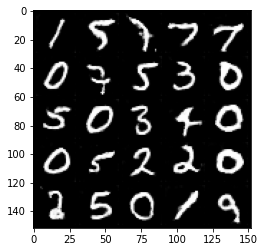

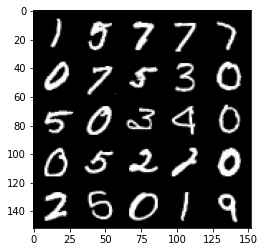

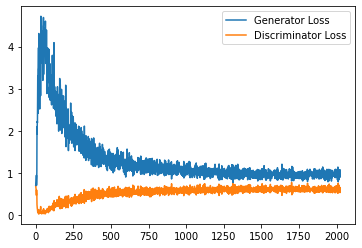

Epoch 87, step 41000: Generator loss: 0.9803564401865006, discriminator loss: 0.609305313706398


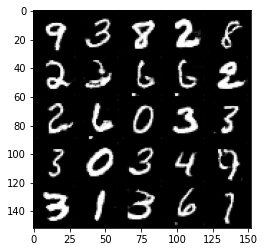

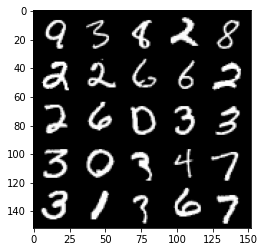

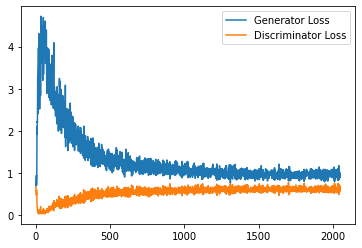

Epoch 88, step 41500: Generator loss: 0.9834969811439515, discriminator loss: 0.6036976750493049


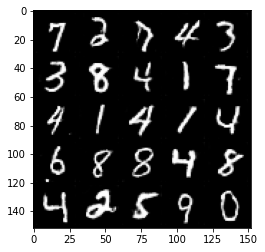

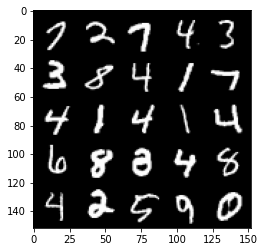

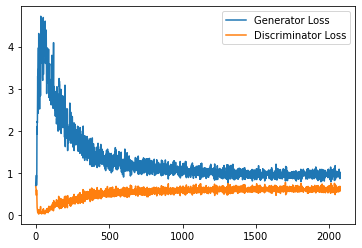

Epoch 89, step 42000: Generator loss: 0.947678361415863, discriminator loss: 0.6072233747839928


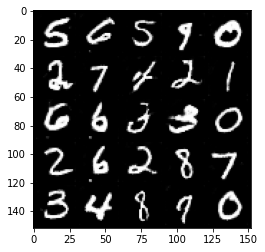

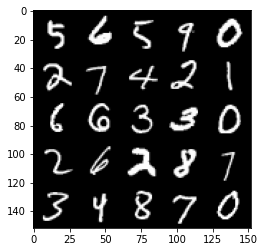

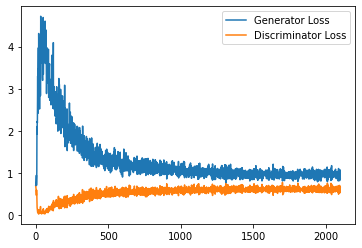

Epoch 90, step 42500: Generator loss: 0.9851469904184341, discriminator loss: 0.6045777100324631


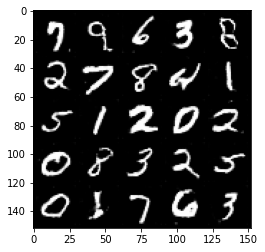

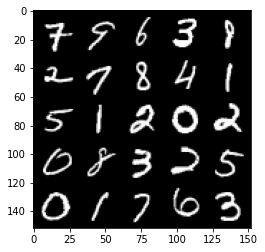

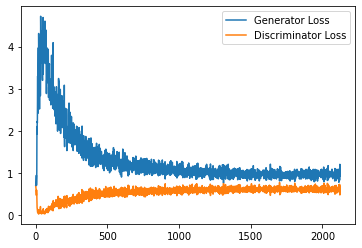

Epoch 91, step 43000: Generator loss: 1.0110721225738526, discriminator loss: 0.6016627669334411


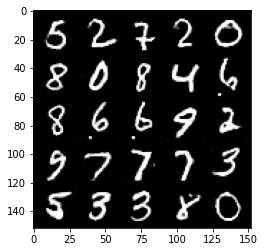

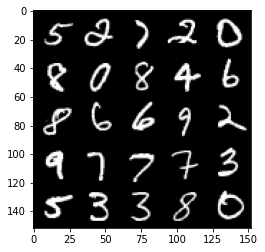

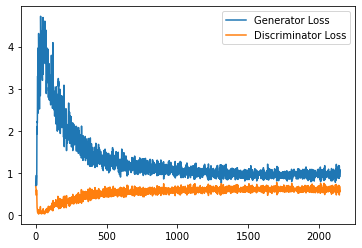

Epoch 92, step 43500: Generator loss: 0.9564653491973877, discriminator loss: 0.6032296615839005


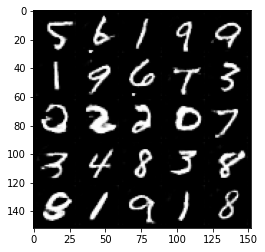

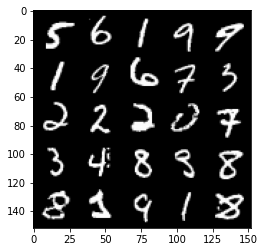

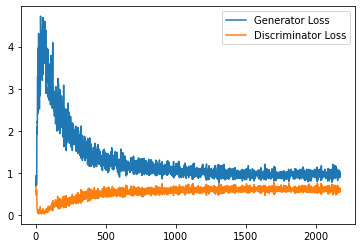

Epoch 93, step 44000: Generator loss: 0.9680410039424896, discriminator loss: 0.5989391776919365


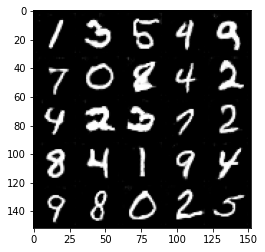

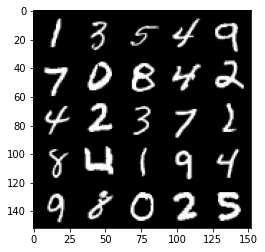

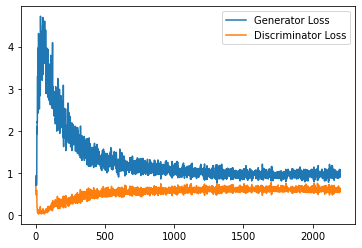

Epoch 94, step 44500: Generator loss: 0.9839385976791382, discriminator loss: 0.6013875263929367


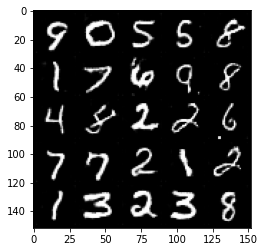

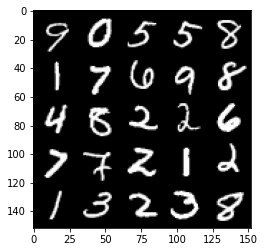

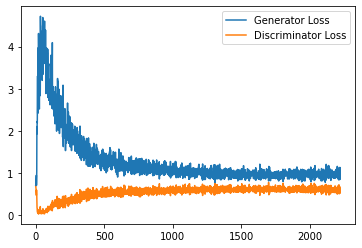

Epoch 95, step 45000: Generator loss: 0.9739699563980102, discriminator loss: 0.6032285795211793


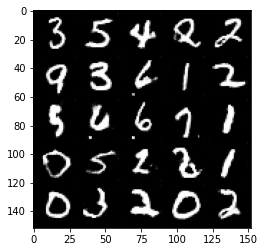

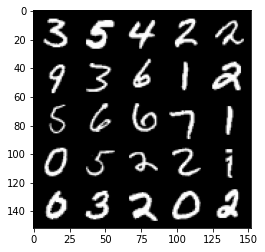

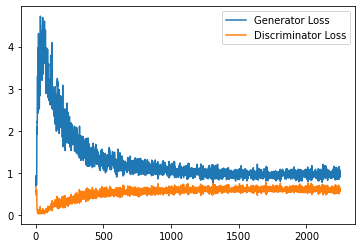

Epoch 97, step 45500: Generator loss: 0.9652942517995834, discriminator loss: 0.6036194325089455


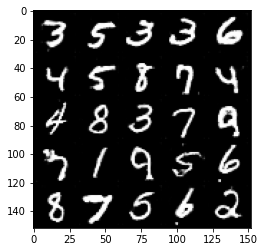

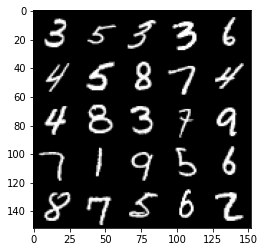

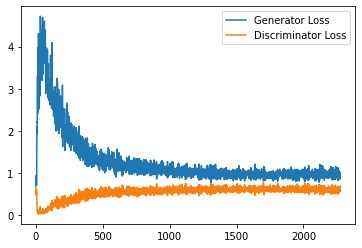

Epoch 98, step 46000: Generator loss: 0.986350124001503, discriminator loss: 0.5933317030668259


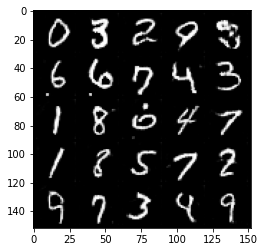

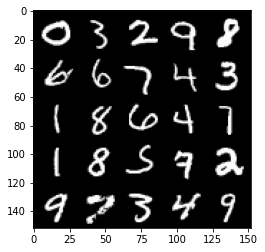

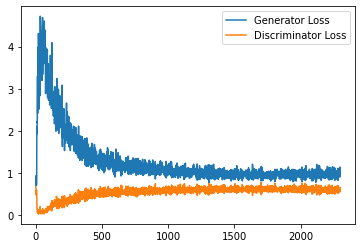

Epoch 99, step 46500: Generator loss: 1.006794102191925, discriminator loss: 0.6016166185736657


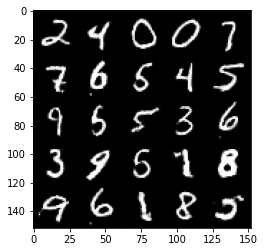

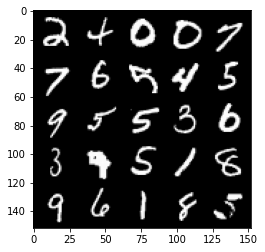

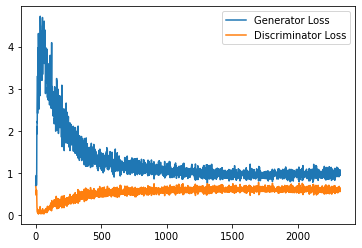

Epoch 100, step 47000: Generator loss: 1.0088049322366714, discriminator loss: 0.5973194660544395


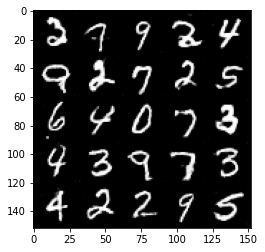

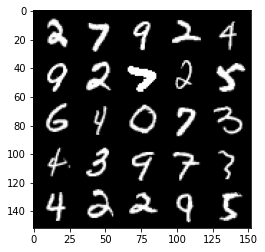

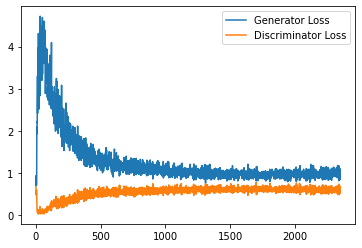

Epoch 101, step 47500: Generator loss: 0.9753200446367264, discriminator loss: 0.5927207577824593


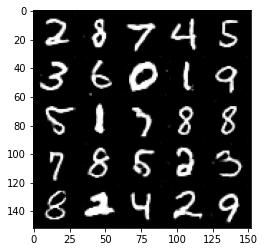

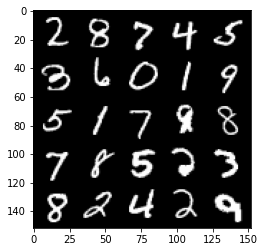

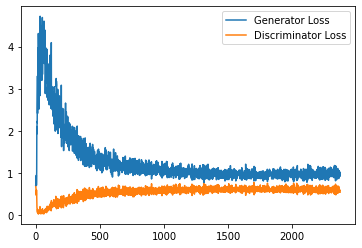

Epoch 102, step 48000: Generator loss: 0.9568221918344497, discriminator loss: 0.5944081760048866


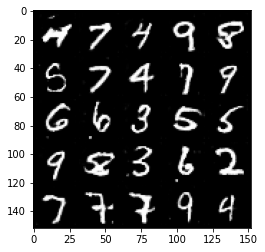

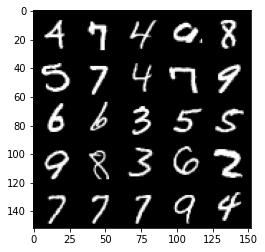

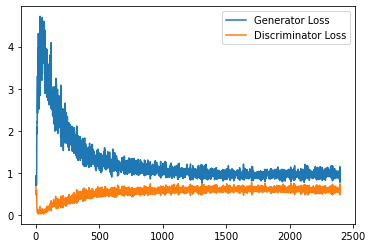

Epoch 103, step 48500: Generator loss: 0.9806344181299209, discriminator loss: 0.590473841547966


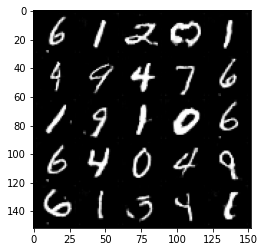

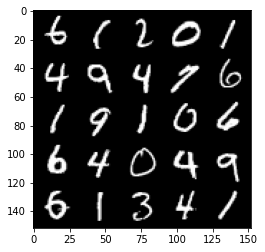

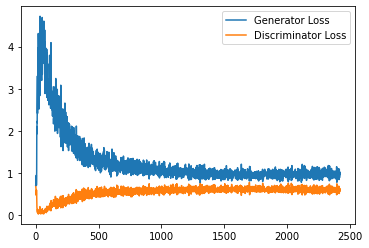

Epoch 104, step 49000: Generator loss: 0.9950319763422012, discriminator loss: 0.5894662219882011


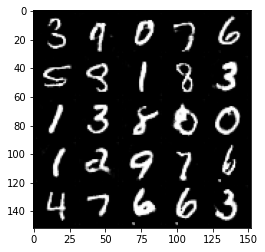

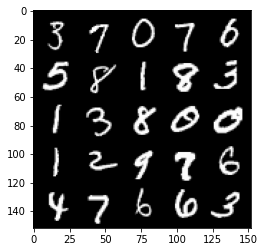

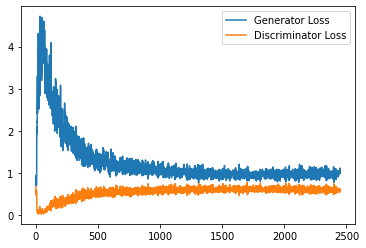

Epoch 105, step 49500: Generator loss: 1.0049717845916748, discriminator loss: 0.5974944111704826


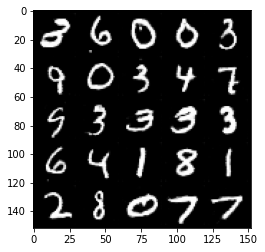

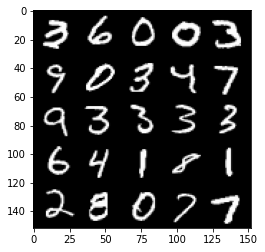

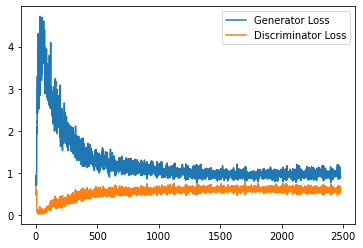

Epoch 106, step 50000: Generator loss: 1.0166594088077545, discriminator loss: 0.589148879468441


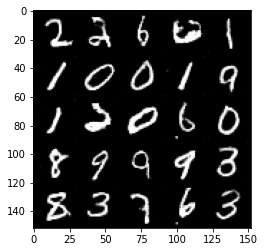

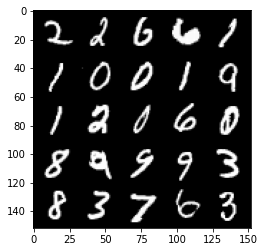

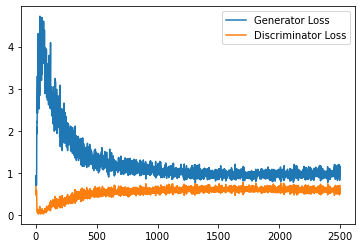

Epoch 107, step 50500: Generator loss: 0.9850067399740219, discriminator loss: 0.5945412911772728


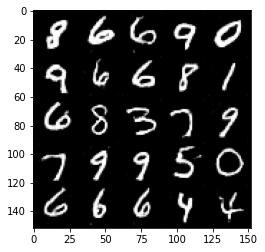

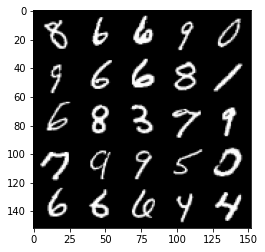

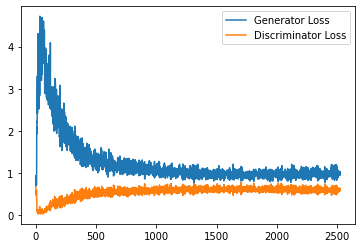

Epoch 108, step 51000: Generator loss: 1.02844772875309, discriminator loss: 0.5877921881079674


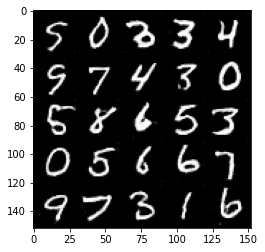

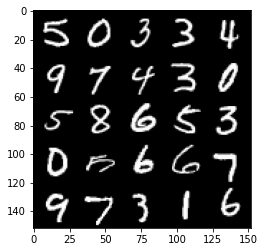

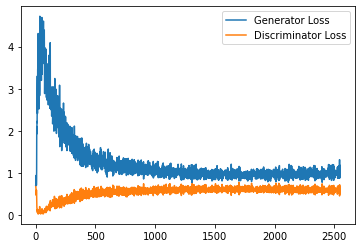

Epoch 109, step 51500: Generator loss: 0.9926650421619415, discriminator loss: 0.5928047620654107


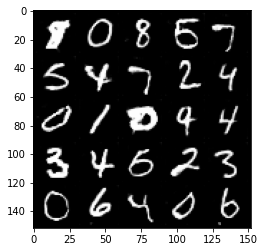

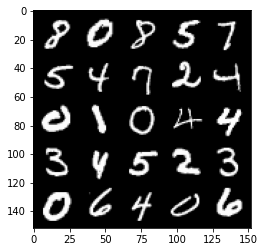

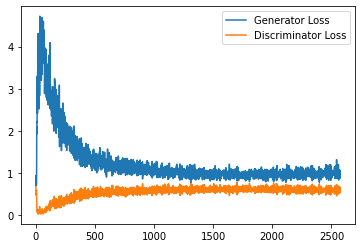

Epoch 110, step 52000: Generator loss: 1.0028248026371003, discriminator loss: 0.5859931136965751


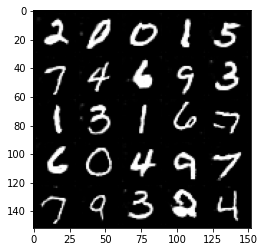

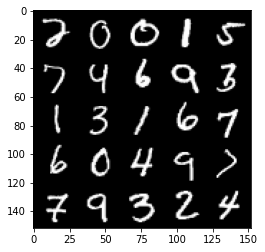

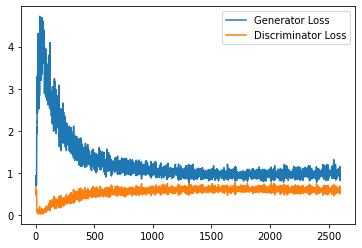

Epoch 111, step 52500: Generator loss: 1.010358001589775, discriminator loss: 0.5903330230712891


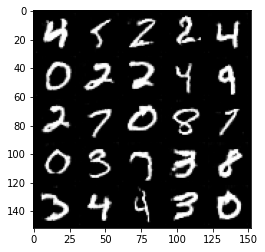

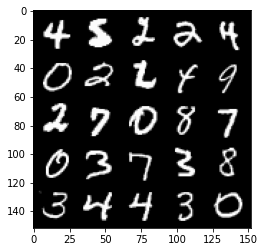

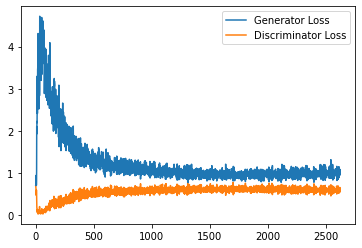

Epoch 113, step 53000: Generator loss: 1.0150733332633972, discriminator loss: 0.5839908776283265


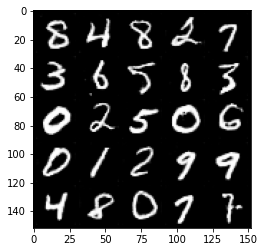

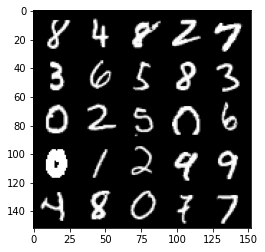

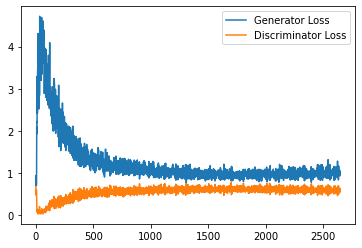

Epoch 114, step 53500: Generator loss: 1.0086833765506744, discriminator loss: 0.5866758840084076


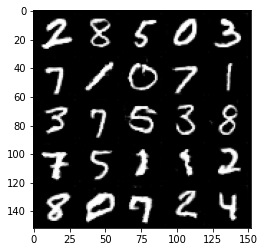

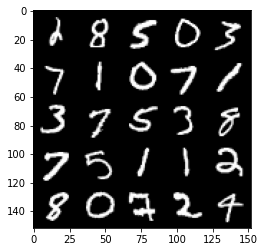

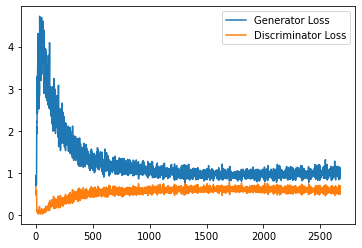

Epoch 115, step 54000: Generator loss: 1.0047787380218507, discriminator loss: 0.5862443708777427


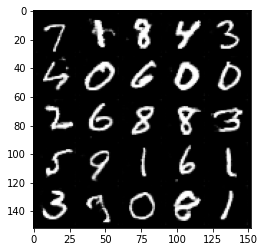

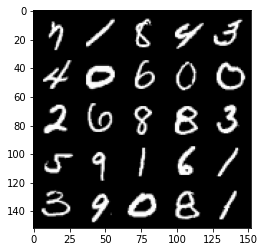

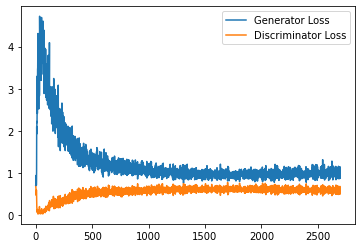

Epoch 116, step 54500: Generator loss: 1.0093823037147522, discriminator loss: 0.5846209167838097


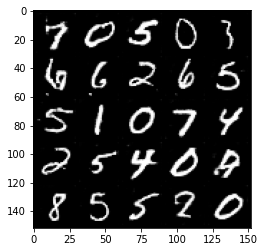

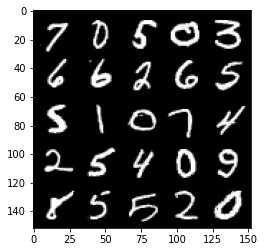

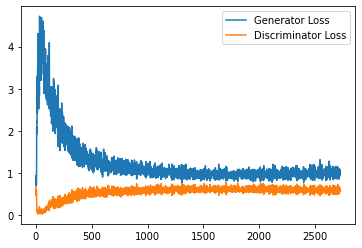

Epoch 117, step 55000: Generator loss: 1.0257713752985, discriminator loss: 0.5869021766781807


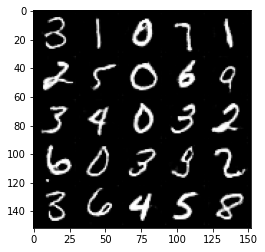

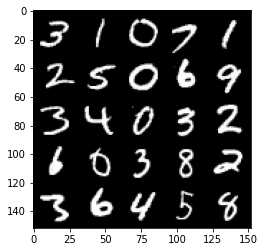

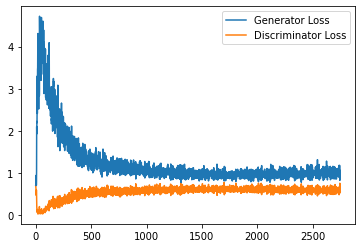

Epoch 118, step 55500: Generator loss: 1.011753477692604, discriminator loss: 0.5823496717810631


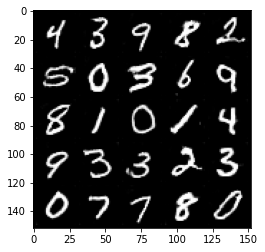

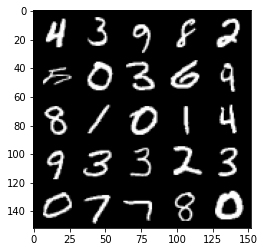

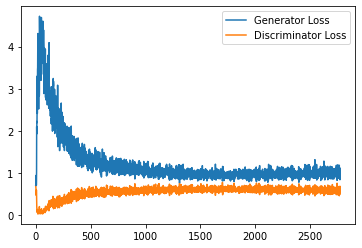

Epoch 119, step 56000: Generator loss: 1.0045809473991394, discriminator loss: 0.5798672826290131


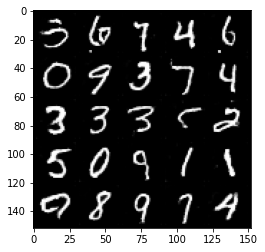

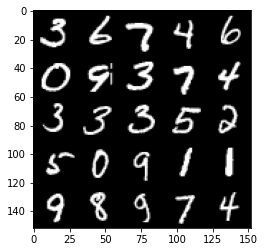

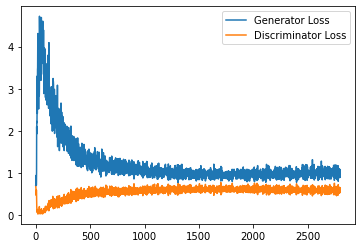

Epoch 120, step 56500: Generator loss: 1.0547801790237428, discriminator loss: 0.5712460371851921


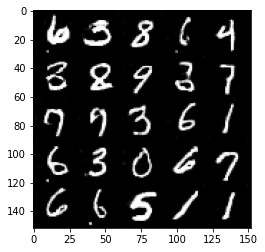

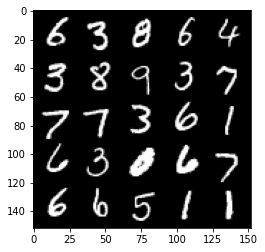

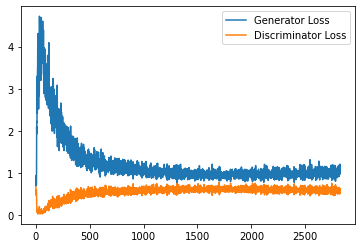

Epoch 121, step 57000: Generator loss: 1.047450488090515, discriminator loss: 0.5796208688020706


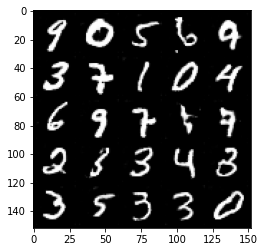

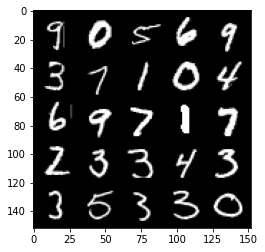

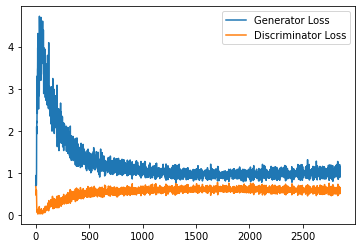

Epoch 122, step 57500: Generator loss: 1.0383917598724366, discriminator loss: 0.5786197766661644


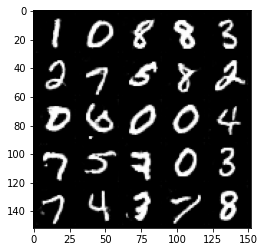

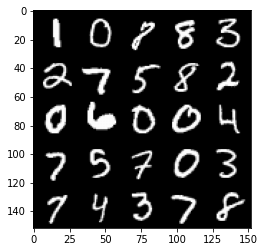

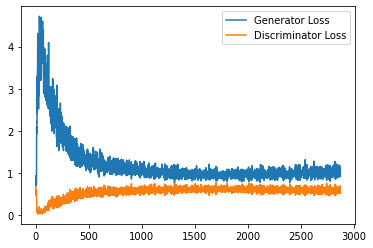

Epoch 123, step 58000: Generator loss: 1.0432799116373062, discriminator loss: 0.5690884928107262


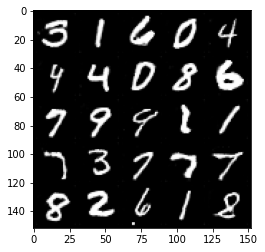

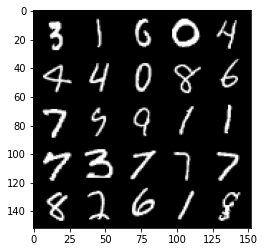

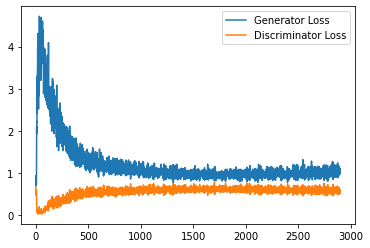

Epoch 124, step 58500: Generator loss: 1.0381736787557603, discriminator loss: 0.567273685514927


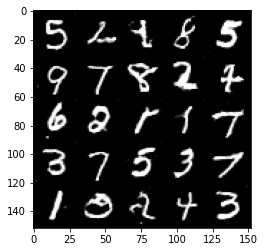

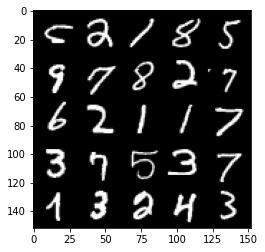

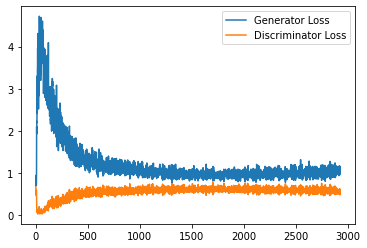

Epoch 125, step 59000: Generator loss: 1.0540927813053131, discriminator loss: 0.5767689345479011


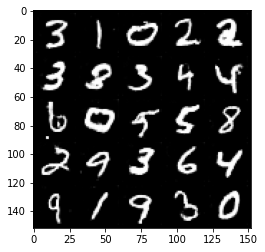

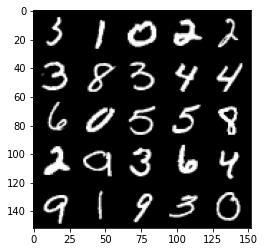

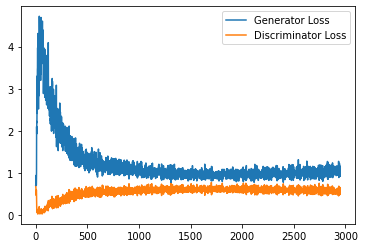

Epoch 126, step 59500: Generator loss: 1.056165410041809, discriminator loss: 0.568242232620716


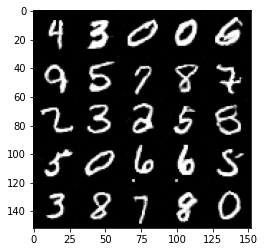

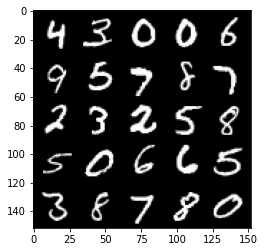

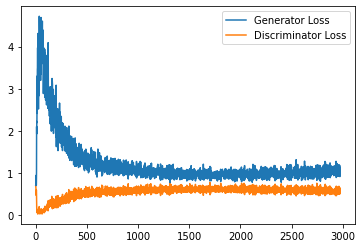

Epoch 127, step 60000: Generator loss: 1.0633136224746704, discriminator loss: 0.5786860474944114


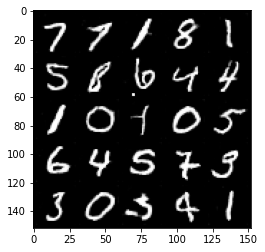

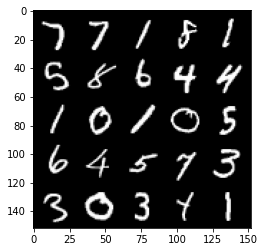

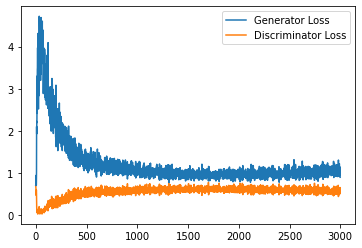

Epoch 128, step 60500: Generator loss: 1.035715317249298, discriminator loss: 0.561600738465786


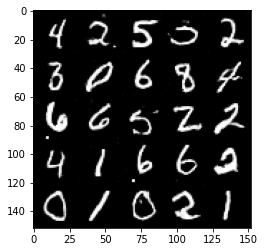

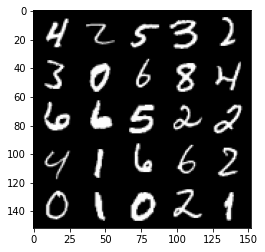

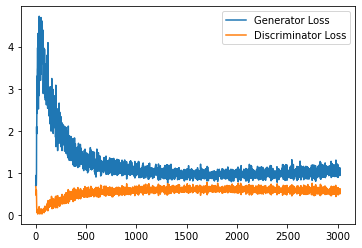

Epoch 130, step 61000: Generator loss: 1.0629520993232726, discriminator loss: 0.5612796555161477


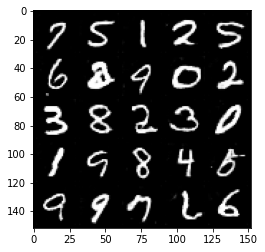

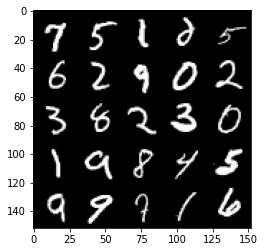

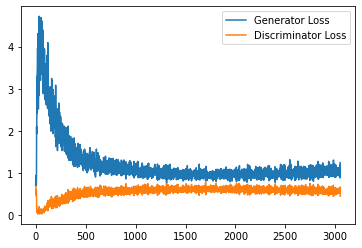

Epoch 131, step 61500: Generator loss: 1.049870852470398, discriminator loss: 0.5748690521121025


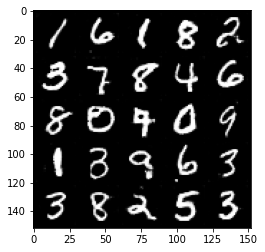

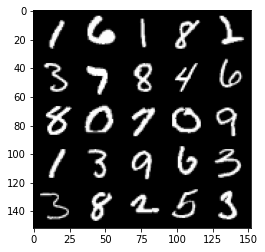

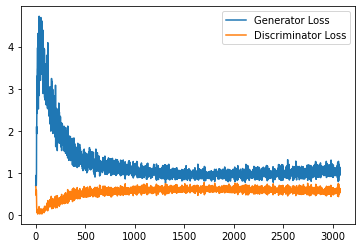

Epoch 132, step 62000: Generator loss: 1.0904480782747268, discriminator loss: 0.563471014201641


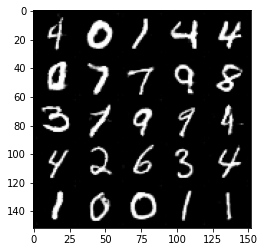

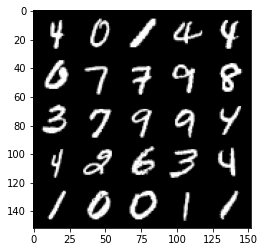

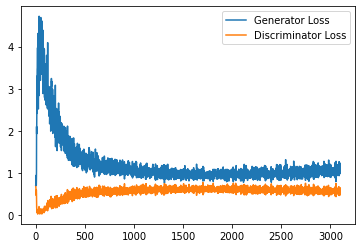

Epoch 133, step 62500: Generator loss: 1.063181513428688, discriminator loss: 0.5715151555538177


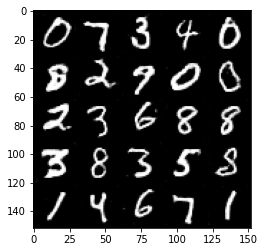

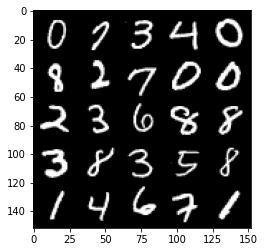

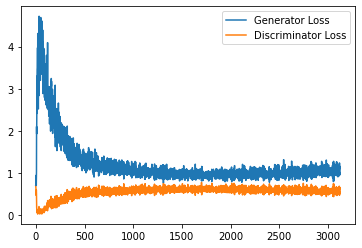

Epoch 134, step 63000: Generator loss: 1.0502504332065583, discriminator loss: 0.5665036798119545


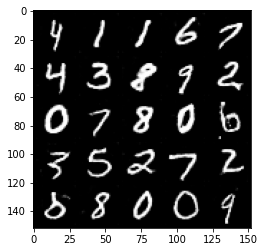

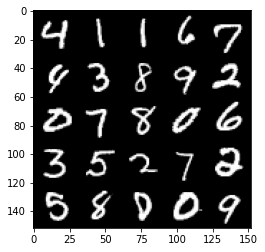

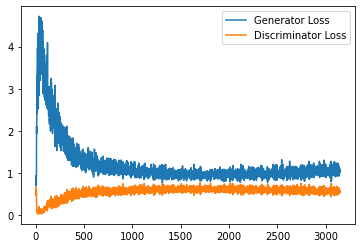

Epoch 135, step 63500: Generator loss: 1.0707009618282317, discriminator loss: 0.5575152881145478


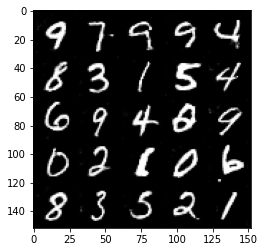

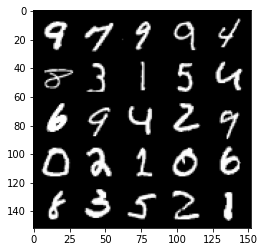

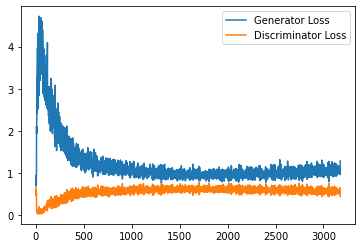

Epoch 136, step 64000: Generator loss: 1.0753300474882126, discriminator loss: 0.5586967285275459


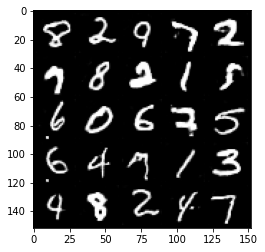

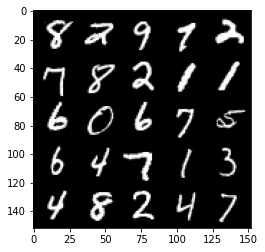

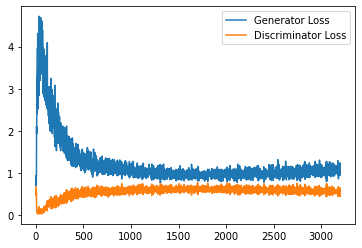

Epoch 137, step 64500: Generator loss: 1.069061674594879, discriminator loss: 0.5621286810040474


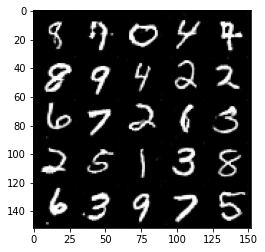

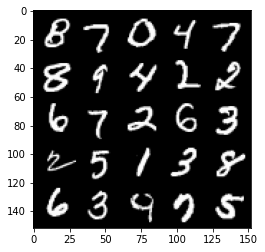

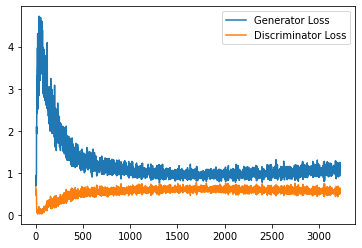

Epoch 138, step 65000: Generator loss: 1.0782945573329925, discriminator loss: 0.5651964855194092


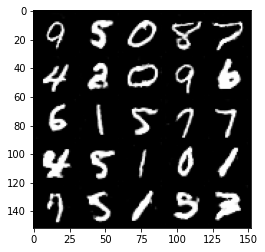

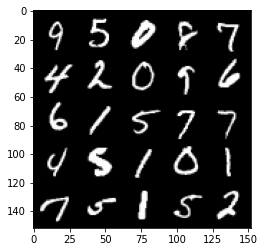

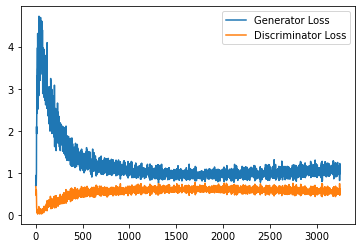

Epoch 139, step 65500: Generator loss: 1.0553817363977431, discriminator loss: 0.5652636396884918


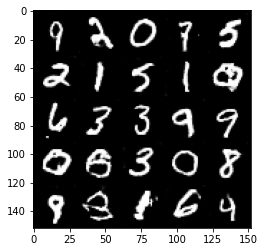

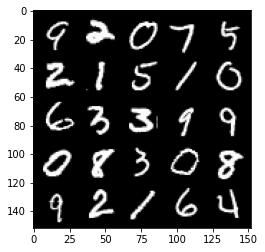

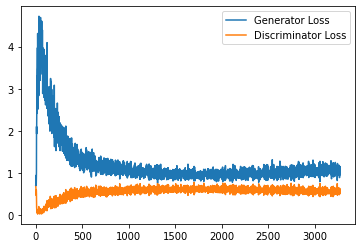

Epoch 140, step 66000: Generator loss: 1.0908994516134263, discriminator loss: 0.555108284831047


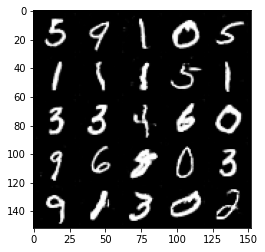

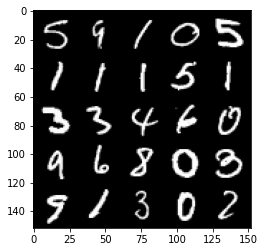

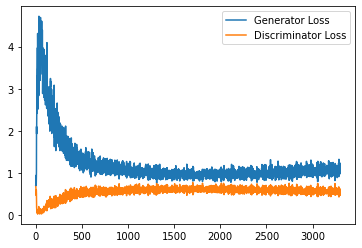

Epoch 141, step 66500: Generator loss: 1.054425436615944, discriminator loss: 0.5630811513066292


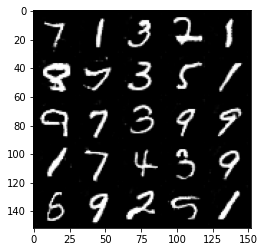

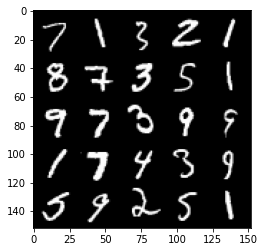

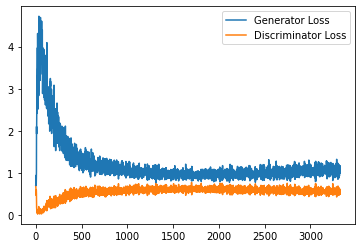

Epoch 142, step 67000: Generator loss: 1.1123991379737854, discriminator loss: 0.55944992095232


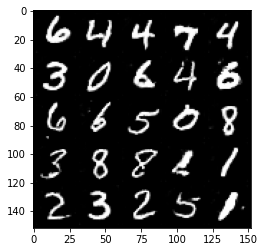

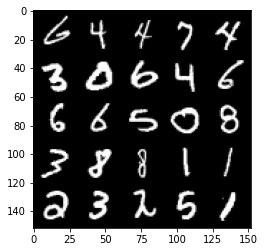

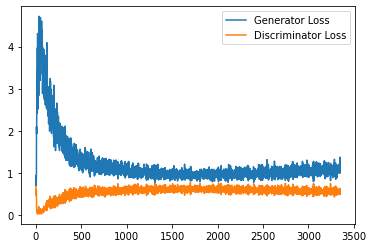

Epoch 143, step 67500: Generator loss: 1.0658170064687729, discriminator loss: 0.5550541444420815


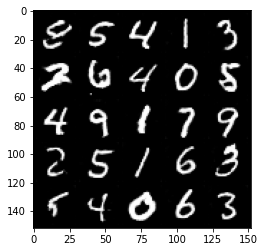

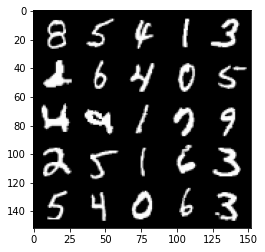

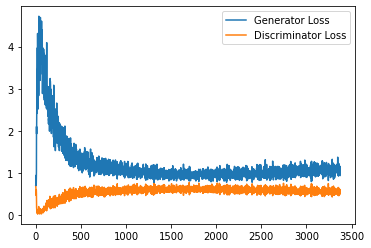

Epoch 144, step 68000: Generator loss: 1.082154208421707, discriminator loss: 0.5567303478121758


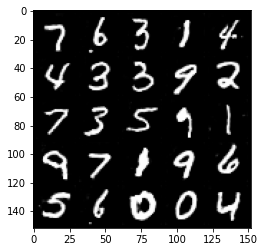

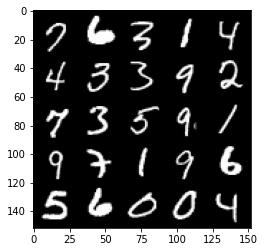

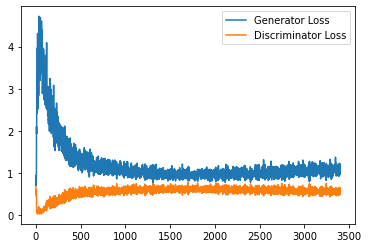

Epoch 146, step 68500: Generator loss: 1.090859393596649, discriminator loss: 0.5540571786761284


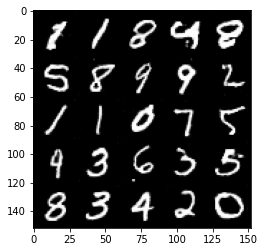

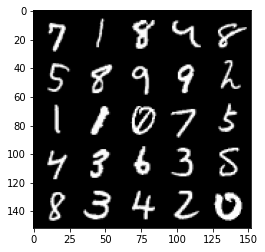

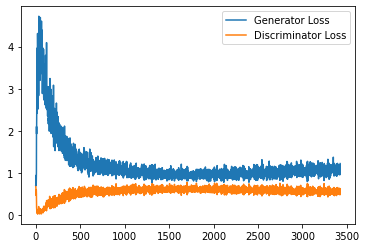

Epoch 147, step 69000: Generator loss: 1.0933182946443558, discriminator loss: 0.5566698960065841


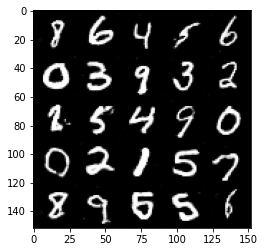

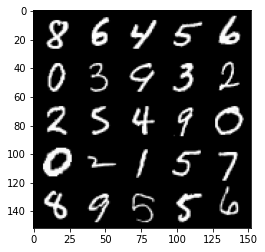

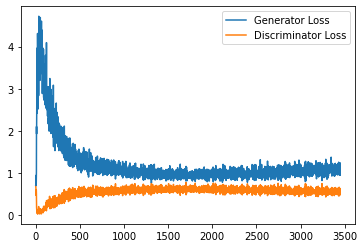

Epoch 148, step 69500: Generator loss: 1.0992319145202636, discriminator loss: 0.5509842528104782


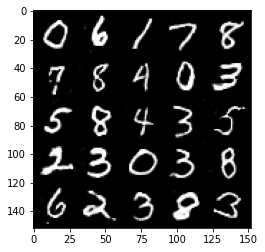

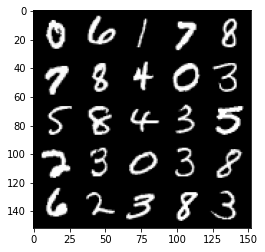

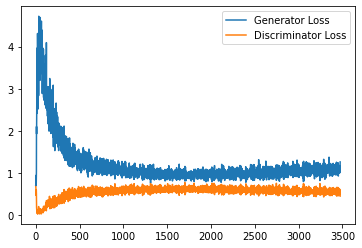

Epoch 149, step 70000: Generator loss: 1.0821295714378356, discriminator loss: 0.5635484088659286


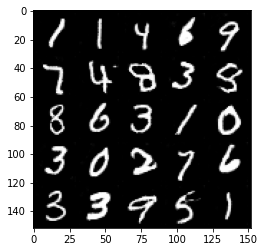

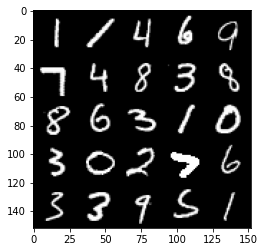

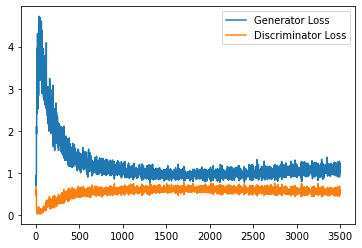

Epoch 150, step 70500: Generator loss: 1.0732688155174255, discriminator loss: 0.5583817008137703


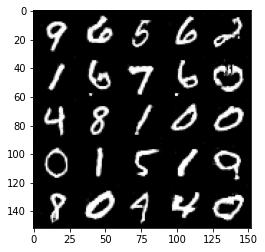

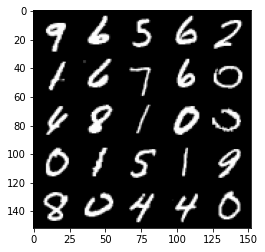

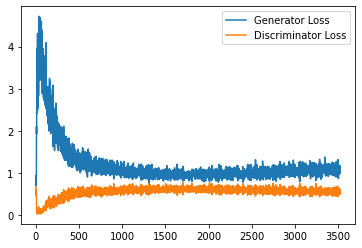

Epoch 151, step 71000: Generator loss: 1.0969445633888244, discriminator loss: 0.5508599124550819


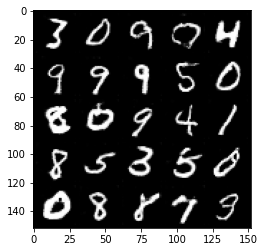

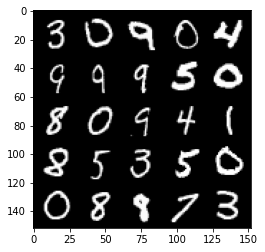

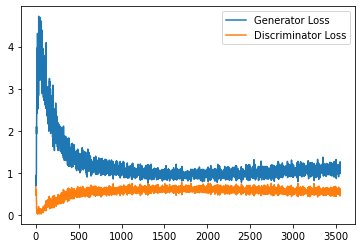

Epoch 152, step 71500: Generator loss: 1.1086003999710083, discriminator loss: 0.5531698571443557


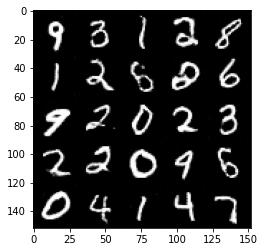

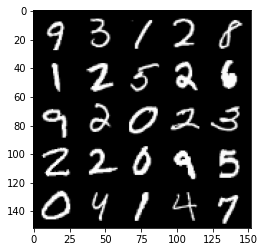

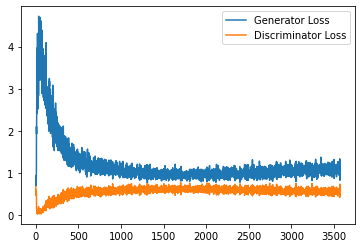

Epoch 153, step 72000: Generator loss: 1.1067403248548509, discriminator loss: 0.5506324665546417


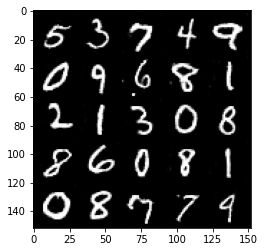

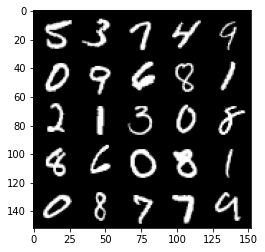

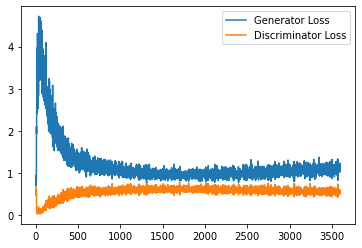

Epoch 154, step 72500: Generator loss: 1.1220807361602783, discriminator loss: 0.5494239873886109


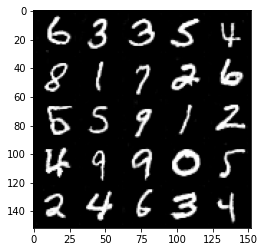

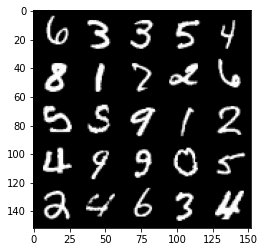

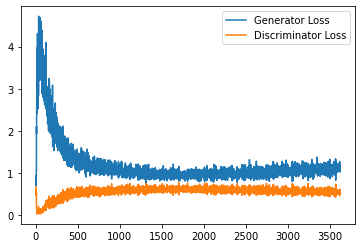

Epoch 155, step 73000: Generator loss: 1.093746754527092, discriminator loss: 0.551725877225399


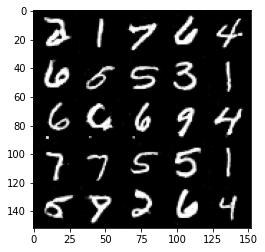

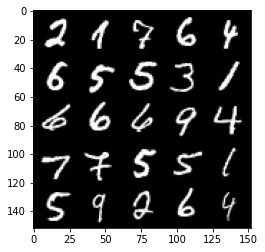

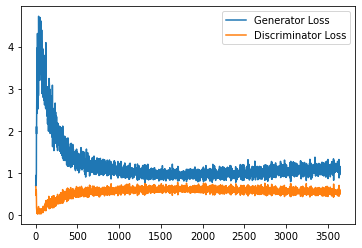

Epoch 156, step 73500: Generator loss: 1.0900510964393615, discriminator loss: 0.5547536760568619


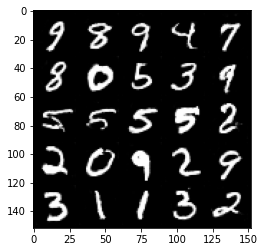

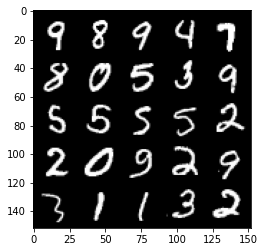

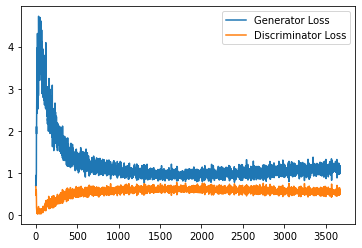

Epoch 157, step 74000: Generator loss: 1.0909546892642974, discriminator loss: 0.5524455707073211


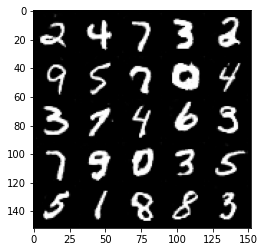

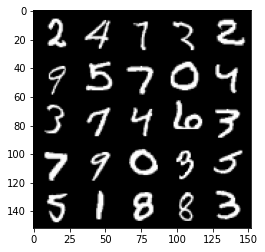

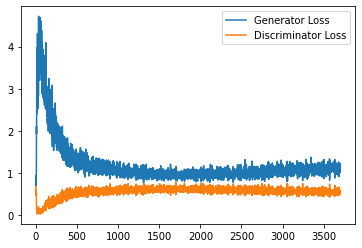

Epoch 158, step 74500: Generator loss: 1.1047929048538208, discriminator loss: 0.5527349996566773


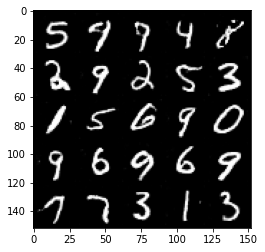

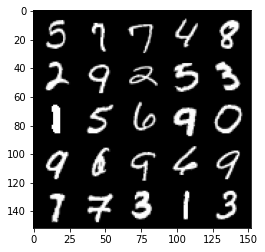

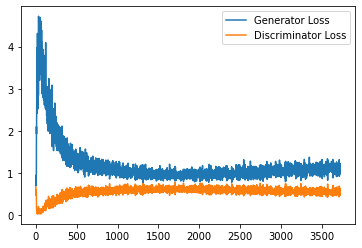

Epoch 159, step 75000: Generator loss: 1.1006901201009751, discriminator loss: 0.5489303611516952


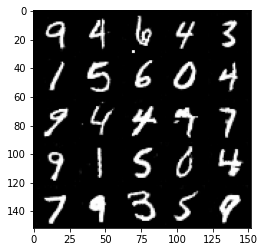

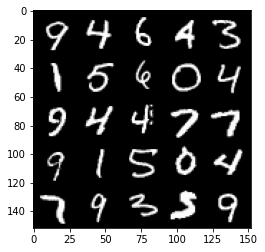

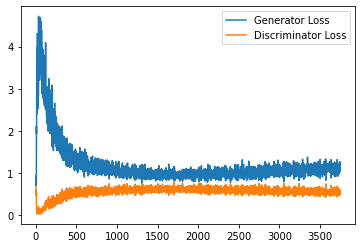

Epoch 160, step 75500: Generator loss: 1.1301602737903595, discriminator loss: 0.550143081843853


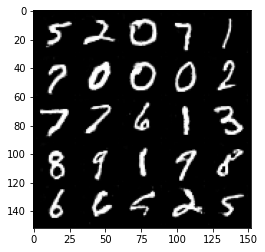

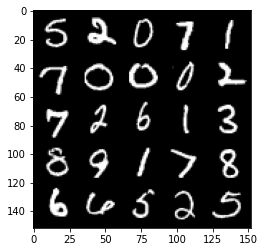

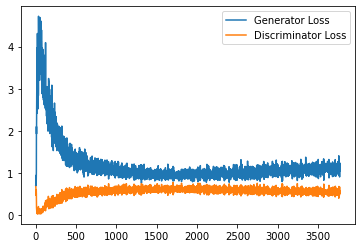

Epoch 162, step 76000: Generator loss: 1.0973986834287643, discriminator loss: 0.5538209636211395


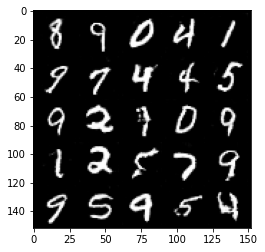

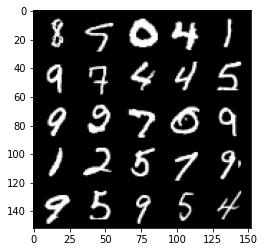

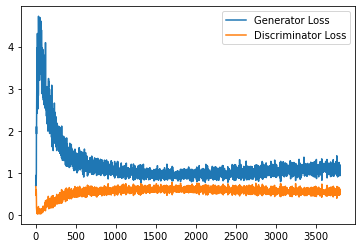

Epoch 163, step 76500: Generator loss: 1.110725154876709, discriminator loss: 0.5511793963313103


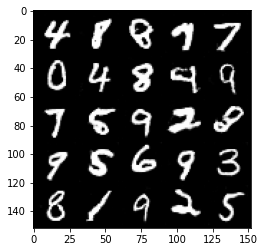

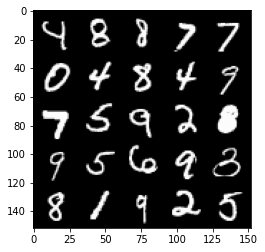

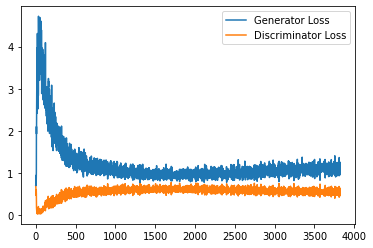

Epoch 164, step 77000: Generator loss: 1.1004537056684494, discriminator loss: 0.549466473698616


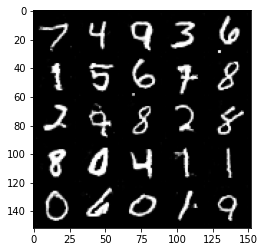

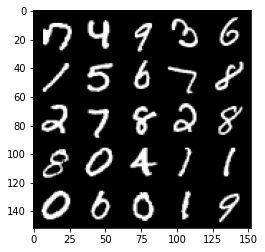

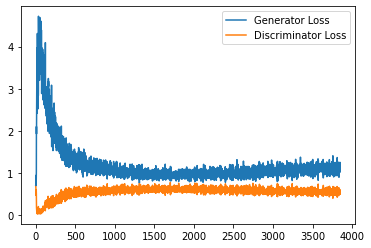

Epoch 165, step 77500: Generator loss: 1.1126319932937623, discriminator loss: 0.5475364899039269


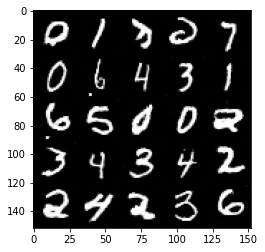

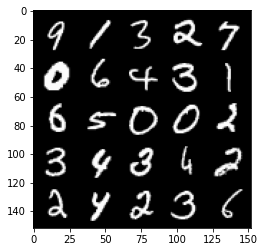

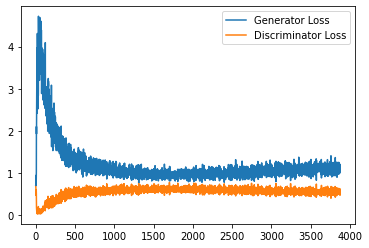

Epoch 166, step 78000: Generator loss: 1.1099294385910035, discriminator loss: 0.5482815438508988


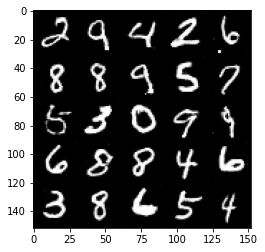

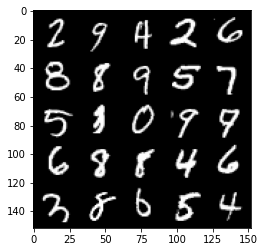

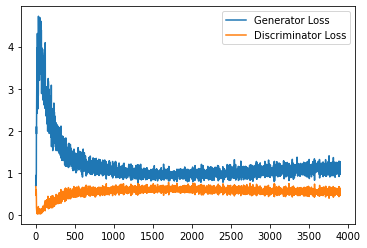

Epoch 167, step 78500: Generator loss: 1.1241187537908555, discriminator loss: 0.5546101210713387


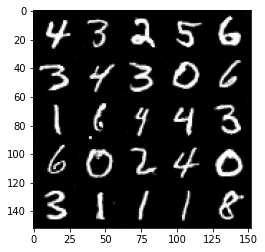

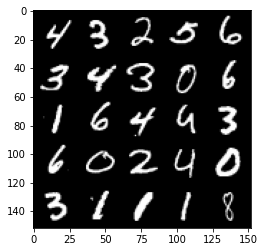

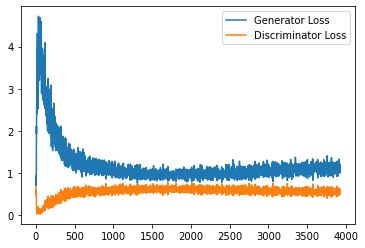

Epoch 168, step 79000: Generator loss: 1.1227019609212876, discriminator loss: 0.5430164653658867


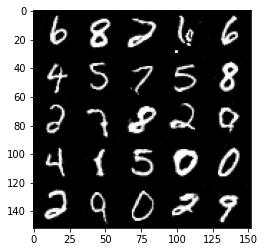

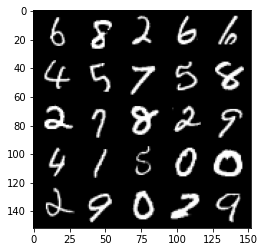

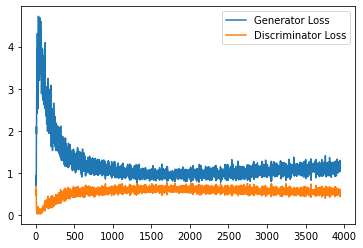

Epoch 169, step 79500: Generator loss: 1.111231127858162, discriminator loss: 0.5501363163590431


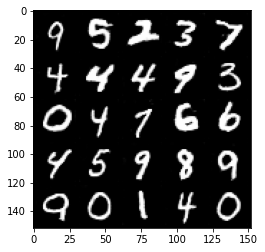

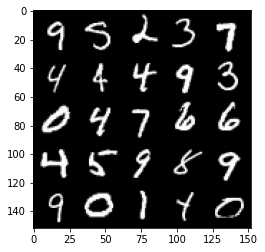

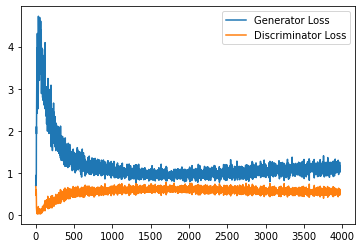

Epoch 170, step 80000: Generator loss: 1.090060555458069, discriminator loss: 0.5503562744259834


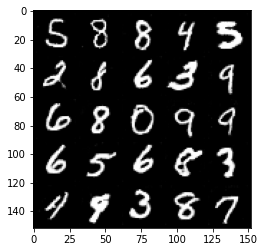

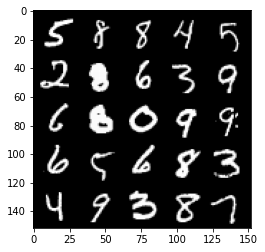

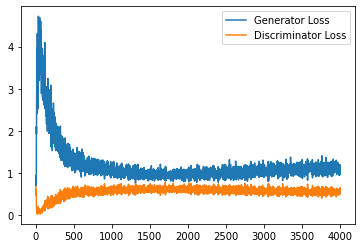

Epoch 171, step 80500: Generator loss: 1.1356395308971405, discriminator loss: 0.5498590126037598


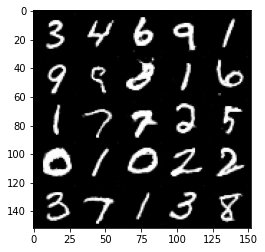

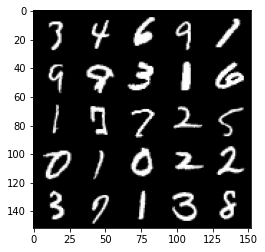

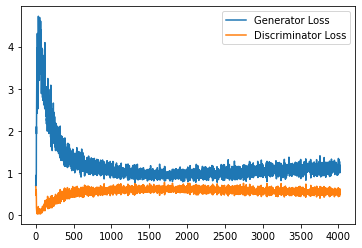

Epoch 172, step 81000: Generator loss: 1.101291623353958, discriminator loss: 0.5497831745147705


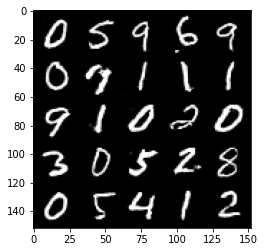

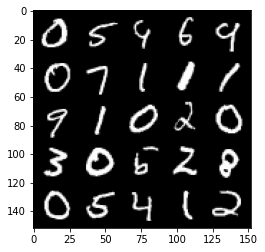

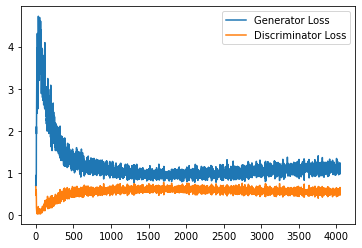

Epoch 173, step 81500: Generator loss: 1.1490034403800964, discriminator loss: 0.55339265614748


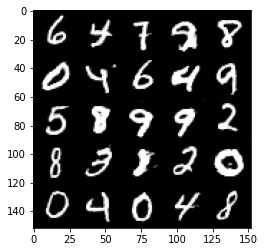

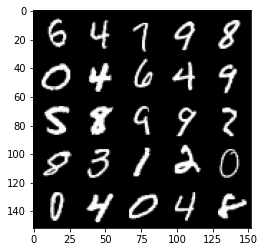

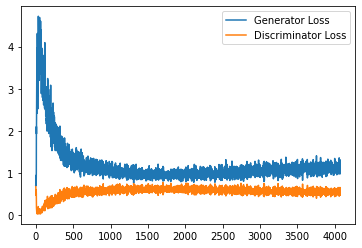

Epoch 174, step 82000: Generator loss: 1.102813349366188, discriminator loss: 0.5560916432738304


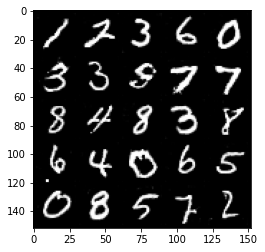

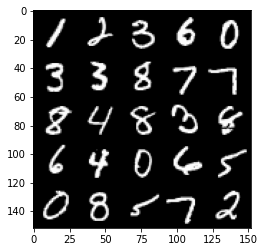

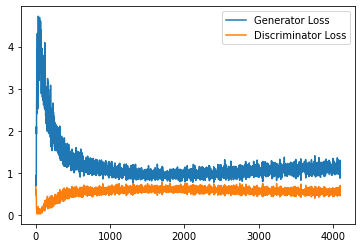

Epoch 175, step 82500: Generator loss: 1.1422125542759896, discriminator loss: 0.5467550220489502


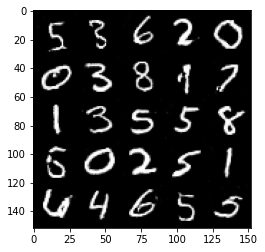

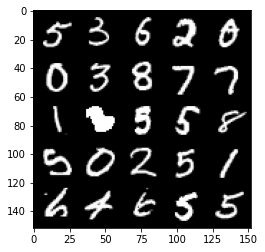

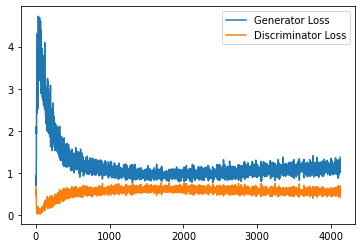

In [ ]:
cur_step = 0
generator_losses = []
discriminator_losses = []
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
       
        # Combine the noise vectors and the one-hot labels for the generator and generate the conditioned fake images
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        
        fake_image_and_labels = combine_vectors(fake.detach(), image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels)
        disc_real_pred = disc(real_image_and_labels)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

## Exploration

In [ ]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

In [ ]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 1 # Choose the start digit
### Change me! ###
end_plot_number = 5 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

### Uncomment the following lines of code if you would like to visualize a set of pairwise class 
### interpolations for a collection of different numbers, all in a single grid of interpolations.
### You'll also see another visualization like this in the next code block!
# plot_numbers = [2, 3, 4, 5, 7]
# n_numbers = len(plot_numbers)
# plt.figure(figsize=(8, 8))
# for i, first_plot_number in enumerate(plot_numbers):
#     for j, second_plot_number in enumerate(plot_numbers):
#         plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
#         interpolate_class(first_plot_number, second_plot_number)
#         plt.axis('off')
# plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
# plt.show()
# plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

In [ ]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()